Data set

You are hired by a company Gem Stones co ltd, which is a cubic zirconia manufacturer. You are provided with the dataset containing the prices and other attributes of almost 27,000 cubic zirconia (which is an inexpensive diamond alternative with many of the same qualities as a diamond). The company is earning different profits on different prize slots. You have to help the company in predicting the price for the stone on the bases of the details given in the dataset so it can distinguish between higher profitable stones and lower profitable stones so as to have better profit share. Also, provide them with the best 5 attributes that are most important.

Data Dictionary: Variable Name : Description

Carat: Carat weight of the cubic zirconia.

Cut: Describe the cut quality of the cubic zirconia.Quality is increasing order Fair, Good, Very Good,Premium,Ideal.

Color: Colour of the cubic zirconia.With D being the best and J the worst.

Clarity :cubic zirconia Clarity refers to the absence of the Inclusions and Blemishes. (In order from Best to Worst, FL = 1. flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3

Depth : The Height of a cubic zirconia, measured from the Culet to the table, divided by its average Girdle Diameter.

Table : The Width of the cubic zirconia's Table expressed as a Percentage of its Average Diameter.

Price : the Price of the cubic zirconia.

X : Length of the cubic zirconia in mm.

Y : Width of the cubic zirconia in mm.

Z : Height of the cubic zirconia in mm.



# Importing Libraries

In [88]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [89]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
#from sklearn.inspection import plot_partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [90]:
# Setting up maximum runtime for the AutoML
min_mem_size=6 
run_time=222

In [91]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

3


In [92]:

port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)
     

Checking whether there is an H2O instance running at http://localhost:29045..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpecpb2sh9
  JVM stdout: /tmp/tmpecpb2sh9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpecpb2sh9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:29045
Connecting to H2O server at http://127.0.0.1:29045 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_pg0xgu
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [93]:
cubic_df = pd.read_csv("https://raw.githubusercontent.com/PranaliSawantt/DSEM/main/cubic_zirconia.csv?token=GHSAT0AAAAAACAR4CEWFI4M5G5NGIKOZ2PUZBEV2MA")

In [94]:
print(cubic_df)

       Unnamed: 0  carat        cut color clarity  depth  table     x     y  \
0               1   0.30      Ideal     E     SI1   62.1   58.0  4.27  4.29   
1               2   0.33    Premium     G      IF   60.8   58.0  4.42  4.46   
2               3   0.90  Very Good     E    VVS2   62.2   60.0  6.04  6.12   
3               4   0.42      Ideal     F     VS1   61.6   56.0  4.82  4.80   
4               5   0.31      Ideal     F    VVS1   60.4   59.0  4.35  4.43   
...           ...    ...        ...   ...     ...    ...    ...   ...   ...   
26962       26963   1.11    Premium     G     SI1   62.3   58.0  6.61  6.52   
26963       26964   0.33      Ideal     H      IF   61.9   55.0  4.44  4.42   
26964       26965   0.51    Premium     E     VS2   61.7   58.0  5.12  5.15   
26965       26966   0.27  Very Good     F    VVS2   61.8   56.0  4.19  4.20   
26966       26967   1.25    Premium     J     SI1   62.0   58.0  6.90  6.88   

          z  price  
0      2.66    499  
1      2.

# DATA CLEANING

In [95]:
cubic_df.isnull().sum()

Unnamed: 0      0
carat           0
cut             0
color           0
clarity         0
depth         697
table           0
x               0
y               0
z               0
price           0
dtype: int64

In [96]:
cubic_df.drop('Unnamed: 0', axis = 1, inplace= True)

In [97]:
cubic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26967 entries, 0 to 26966
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    26967 non-null  float64
 1   cut      26967 non-null  object 
 2   color    26967 non-null  object 
 3   clarity  26967 non-null  object 
 4   depth    26270 non-null  float64
 5   table    26967 non-null  float64
 6   x        26967 non-null  float64
 7   y        26967 non-null  float64
 8   z        26967 non-null  float64
 9   price    26967 non-null  int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 2.1+ MB


## Removing Duplicates

In [98]:
duplicate_rows = cubic_df[cubic_df.duplicated()]
print("No. of duplicate rows: ", duplicate_rows.shape[0])

No. of duplicate rows:  34


In [99]:
cubic_df.drop_duplicates(inplace=True)
print("No. of rows after dropping duplicates: ", cubic_df.shape[0])

No. of rows after dropping duplicates:  26933


## Imputation using median

In [107]:
print("Median- {:.2f}".format(cubic_df['depth'].median()))

Median- 61.80


In [108]:
cubic_df['depth'].fillna(61.8, inplace=True)

In [109]:
print("Median- {:.2f}".format(cubic_df['price'].median()))

Median- 2375.00


In [112]:
cubic_df['price'].fillna(2375.00, inplace=True)

In [113]:
cubic_df.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
x          0
y          0
z          0
price      0
dtype: int64

## Imputation using Mean


In [114]:
print("Mean- {:.2f}".format(cubic_df['depth'].mean()))

Mean- 61.75


In [106]:
cubic_df['depth'].fillna(61.75, inplace=True)

# Imputation using KNN

In [19]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler

In [115]:
df_depth = cubic_df[['depth']]
df_depth['number_copy_1_percent'] = cubic_df[['depth']]
df_depth['number_copy_5_percent'] = cubic_df[['depth']]
df_depth['number_copy_10_percent'] = cubic_df[['depth']]
df_depth

,depth,number_copy_1_percent,number_copy_5_percent,number_copy_10_percent
0,62.1,62.1,62.1,62.1
1,60.8,60.8,60.8,60.8
2,62.2,62.2,62.2,62.2
3,61.6,61.6,61.6,61.6
4,60.4,60.4,60.4,60.4
...,...,...,...,...
26962,62.3,62.3,62.3,62.3
26963,61.9,61.9,61.9,61.9
26964,61.7,61.7,61.7,61.7
26965,61.8,61.8,61.8,61.8


In [116]:
def get_percent_missing(df):
    
    percent_missing = df.isnull().sum() * 100 / len(df)
    missing_value_df = pd.DataFrame({'column_name': df.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [117]:
print(get_percent_missing(df_depth))

                                   column_name  percent_missing
depth                                    depth              0.0
number_copy_1_percent    number_copy_1_percent              0.0
number_copy_5_percent    number_copy_5_percent              0.0
number_copy_10_percent  number_copy_10_percent              0.0


In [118]:
def create_missing(df, percent, col):
    df.loc[df.sample(frac = percent).index, col] = np.nan

In [119]:
create_missing(df_depth, 0.01, 'number_copy_1_percent')
create_missing(df_depth, 0.05, 'number_copy_5_percent')
create_missing(df_depth, 0.1, 'number_copy_10_percent')

In [120]:
print(get_percent_missing(df_depth))

                                   column_name  percent_missing
depth                                    depth         0.000000
number_copy_1_percent    number_copy_1_percent         0.998775
number_copy_5_percent    number_copy_5_percent         5.001300
number_copy_10_percent  number_copy_10_percent         9.998886


In [ ]:
# Store Index of NaN values in each coloumns
number_1_idx = list(np.where(df_depth['number_copy_1_percent'].isna())[0])
number_5_idx = list(np.where(df_depth['number_copy_5_percent'].isna())[0])
number_10_idx = list(np.where(df_depth['number_copy_10_percent'].isna())[0])

In [ ]:
print(f"Length of number_1_idx is {len(number_1_idx)} and it contains {(len(number_1_idx)/len(df_depth['number_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_depth['number_copy_1_percent'])}")
print(f"Length of number_5_idx is {len(number_5_idx)} and it contains {(len(number_5_idx)/len(df_depth['number_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_depth['number_copy_1_percent'])}")
print(f"Length of number_10_idx is {len(number_10_idx)} and it contains {(len(number_10_idx)/len(df_depth['number_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_depth['number_copy_1_percent'])}")

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
dataframe_imputation1 = df_depth[['number_copy_1_percent','number_copy_5_percent','number_copy_10_percent']]
imputer = KNNImputer(n_neighbors=5)
imputed_number_df = pd.DataFrame(imputer.fit_transform(dataframe_imputation1), columns = dataframe_imputation1.columns)

In [ ]:
depth = cubic_df["depth"]
imputed_mean = pd.concat([depth,imputed_number_df])
imputed_mean.columns = ["depth",'number_copy_1_percent','number_copy_5_percent','number_copy_10_percent']
imputed_mean.var()

## Analysis of Categorical columns

By Cut

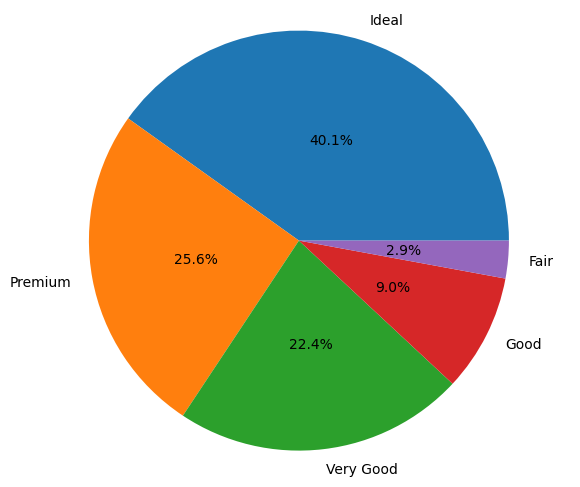

In [121]:
#By Cut
x = cubic_df['cut'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=cubic_df['cut'].unique(), autopct='%1.1f%%', pctdistance=0.5)
plt.axis('equal')
plt.show()

By Color

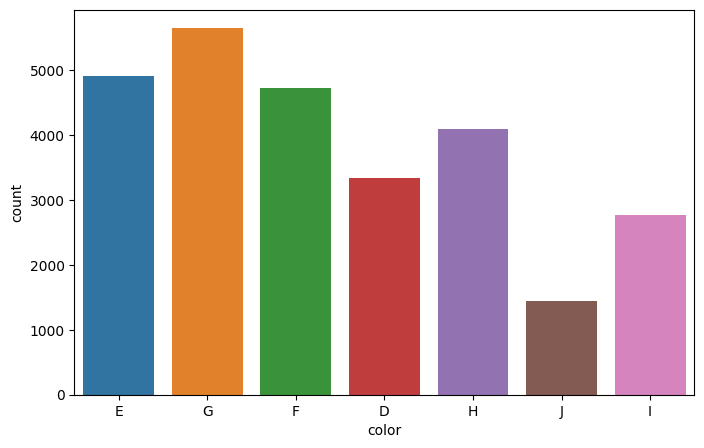

In [122]:
#By Color
plt.figure(figsize=(8, 5))
sns.countplot(x='color', data=cubic_df)
plt.show()

By Clarity

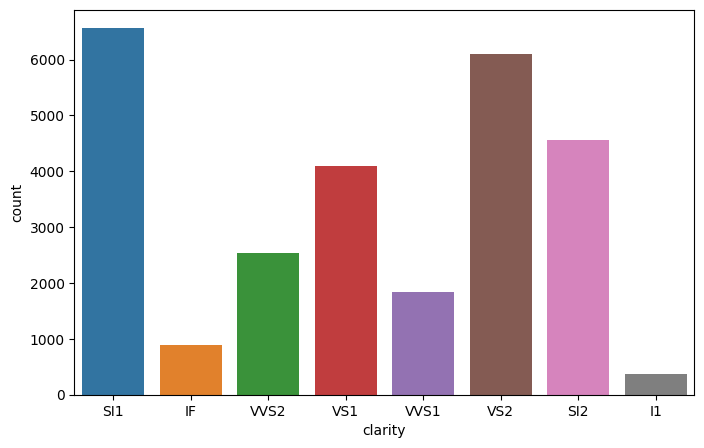

In [123]:
#By Clarity
plt.figure(figsize=(8, 5))
sns.countplot(x='clarity', data=cubic_df)
plt.show()

## Analysis of Numerical columns

In [124]:
numerical_data = cubic_df.select_dtypes(include='number')
num_cols = numerical_data.columns
print("Numerical columns: ", num_cols)

Numerical columns:  Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'price'], dtype='object')


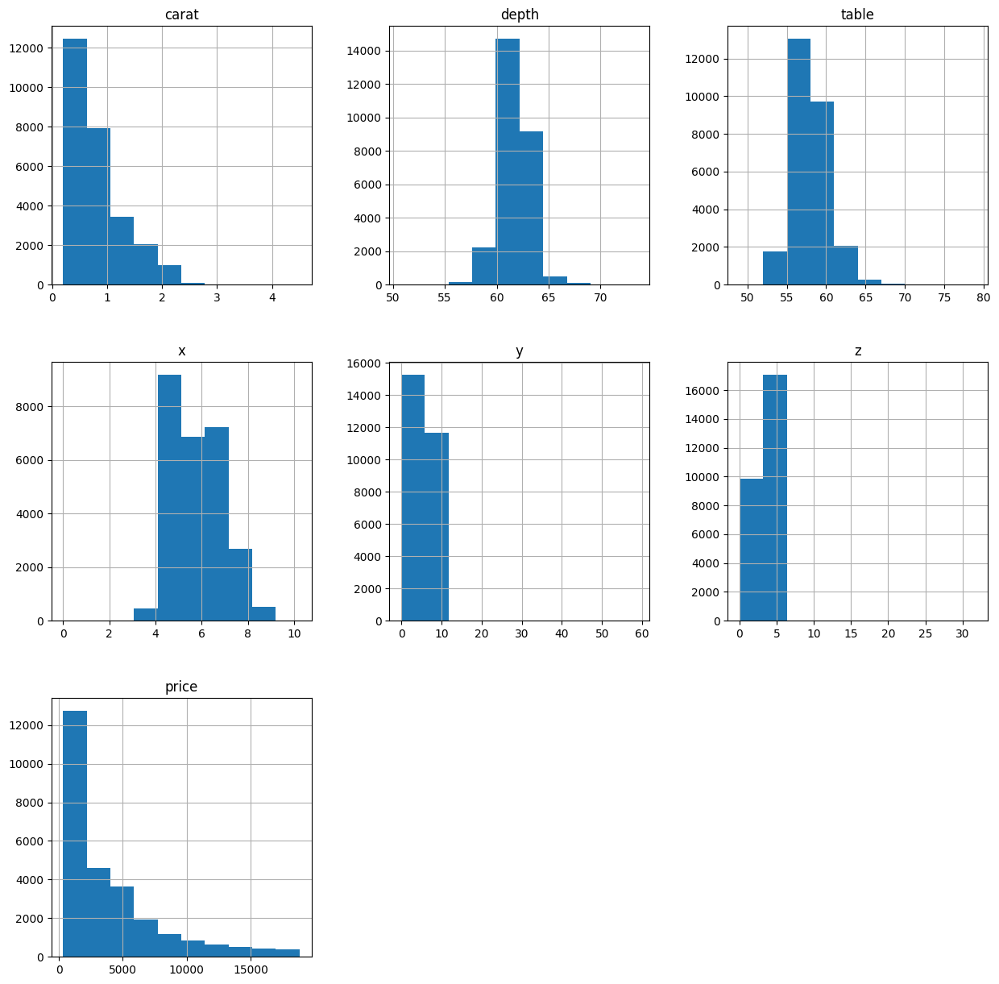

In [125]:
cubic_df[num_cols].hist(figsize=(15, 15))
plt.show()

## What are the distributions of the predictor variables?

All independent variables seem to roughly follow normal distribution based on the Q-Q plots.

From the above plotted histogram for numerical features, we can clearly see that the 'price' and 'carat' columns are highly skewed towards the right.

From the above plotted pie and countplots for categorical features - Cut, Color and Clarity are categorical features.

Cut has categorical values namely Ideal, Good, Very Good, Premium and Fair.

Color has categorical values namely E, G, F, D, H, J and I.

Clarity has categorical values namely SI1, IF, VVS2, VS1, VVS1, VS2, SI2 and I1

# Checking Outliers

<Axes: >

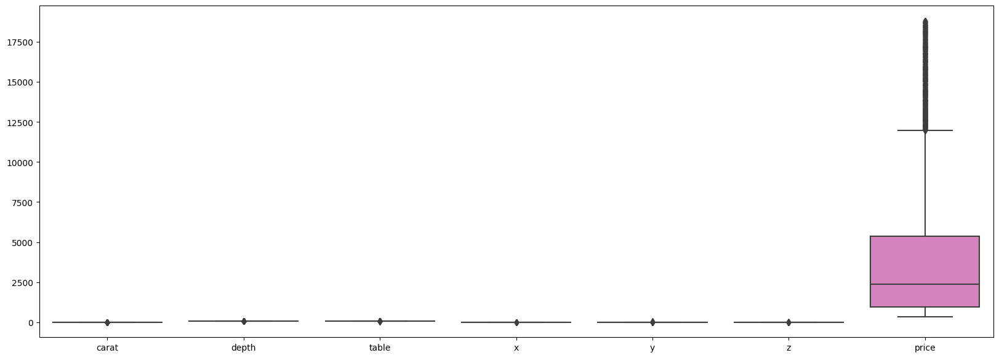

In [126]:
#Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(20,7))
sns.boxplot(data=cubic_df)

Do the ranges of the predictor variables make sense?
Inferring from the box plot above Carat, Depth consists of outliers.

All the predictor variables range between the scale of 0-10 except depth and table.

'price' and 'carat' columns are highly skewed towards the right.

Cut, Color and Clarity are categorical features.

## Removing Outliers

In [127]:
numerical_df = cubic_df.select_dtypes(include='number')
num_cols = numerical_df.columns
print("Numerical columns: ", num_cols)

Numerical columns:  Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'price'], dtype='object')


In [128]:
#Removing outliers
Q1 = cubic_df[num_cols].quantile(0.25)
Q3 = cubic_df[num_cols].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

carat       0.65
depth       1.40
table       3.00
x           1.84
y           1.83
z           1.14
price    4411.00
dtype: float64


In [129]:
num_cols=cubic_df.select_dtypes(['float64'])
for col in num_cols:
   Q1 = cubic_df[col].quantile(0.25)
   Q3 = cubic_df[col].quantile(0.75) 
   IQR=Q3-Q1
   cubic_df=cubic_df[~((cubic_df[col]<(Q1-1.5*IQR)) | (cubic_df[col]>(Q3+1.5*IQR)))]

print("No. of rows remaining: ", cubic_df.shape[0])

No. of rows remaining:  24719


## After Removal of Outliers

<Axes: >

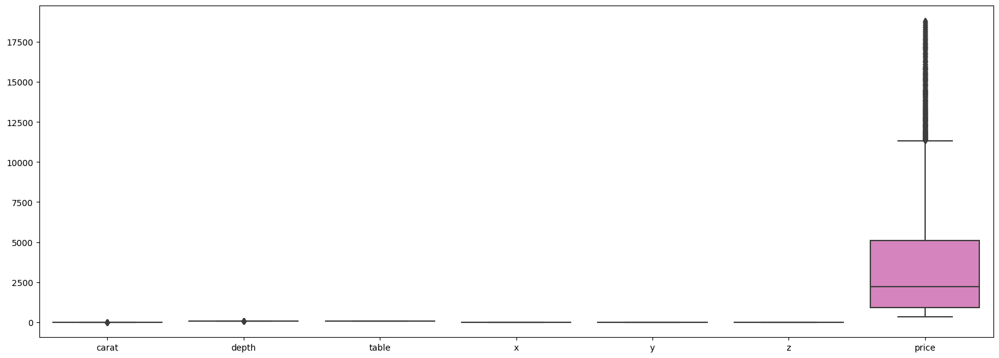

In [130]:
plt.figure(figsize=(20,7))
sns.boxplot(data=cubic_df)

# DATA CORRELATION

<Axes: >

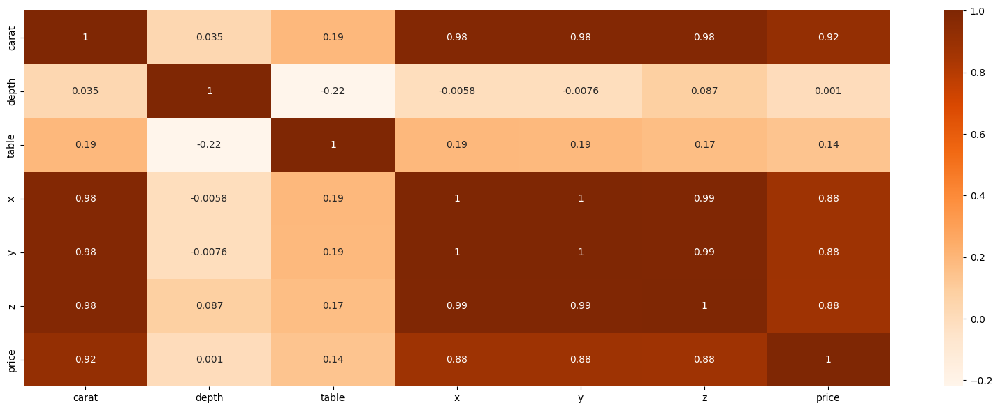

In [131]:
plt.figure(figsize=(20,7))
sns.heatmap(cubic_df.corr(), annot=True, cmap="Oranges")

The dimension columns x, y, and z have strong relationships with one another. Each of the dimension columns has a strong correlation with the "carat" columns. As a result, we could eliminate one or two of these columns to prevent multi-collinearity.

### Checking the correlation of independent variables with dependent variable -

The output column "price" and the columns "depth" and "table" exhibit noticeably low correlations (0.02 and 0.18, respectively). They are not making a significant impact on the creation of a specific result. So, in order to lower the dataset's dimensionality, they must be eliminated.



Is there any multicollinearity in the model?

When one independent variable is related to another independent variable that is its highly correlated then multicollinearity exists in the model. It’s an issue as it undermines the statistical significance of an independent variable. Multicollinearity can be determined by computing correlation matrix or calculating VIF value of all variables. In correlation matrix a coefficient closer to +1 or -1 tells us that those two variables are highly correlated. For VIF values a value above 10 tells us that multicollinearity exists. In this model the dimension columns x, y, and z have strong relationships with one another. Each of the dimension columns has a strong correlation with the "carat" columns. The output column "price" and the columns "depth" and "table" exhibit noticeably low correlations (0.02 and 0.18, respectively). They are not making a significant impact on the creation of a specific result.


In the multivariate models are predictor variables independent of all the other predictor variables?

Variables are said to be independent when there is no relation between them. To check this relation, correlation matrix can be used. No, they are not independent of each other. There is multi - collinearity among lot of the independent variable which is shown by the correlation table and pair plot map. Here z and x, z and y, z and carat, y and carat, x and carat are all highly correlated.

## Plotting the Q-Q Plot

<Figure size 800x500 with 0 Axes>

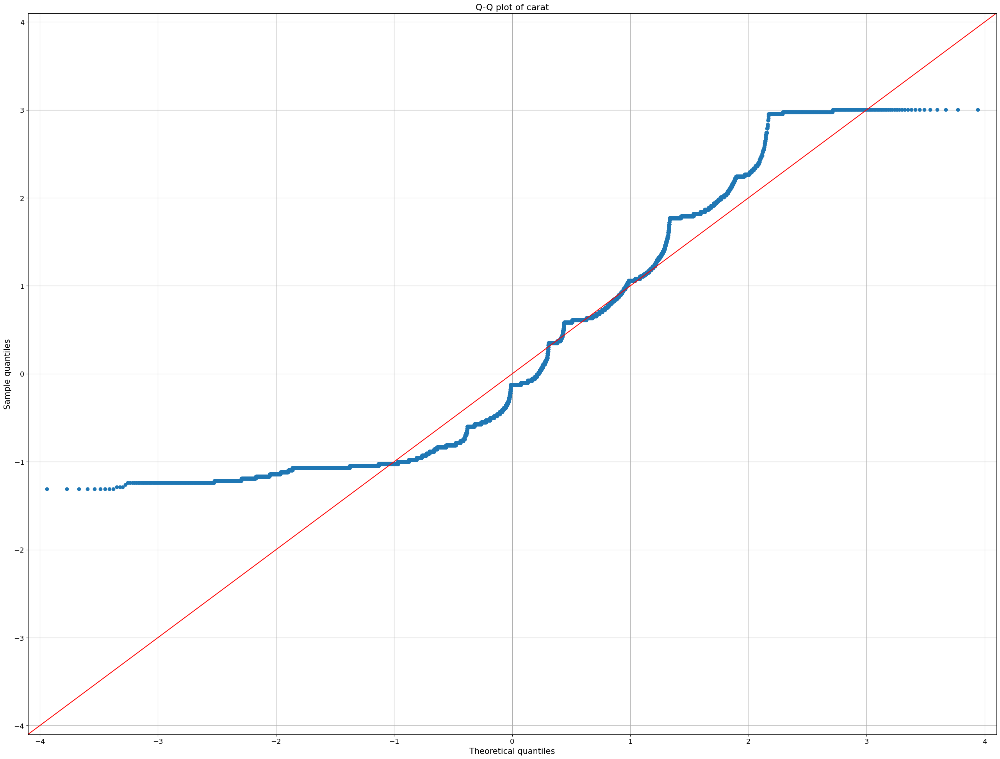

<Figure size 800x500 with 0 Axes>

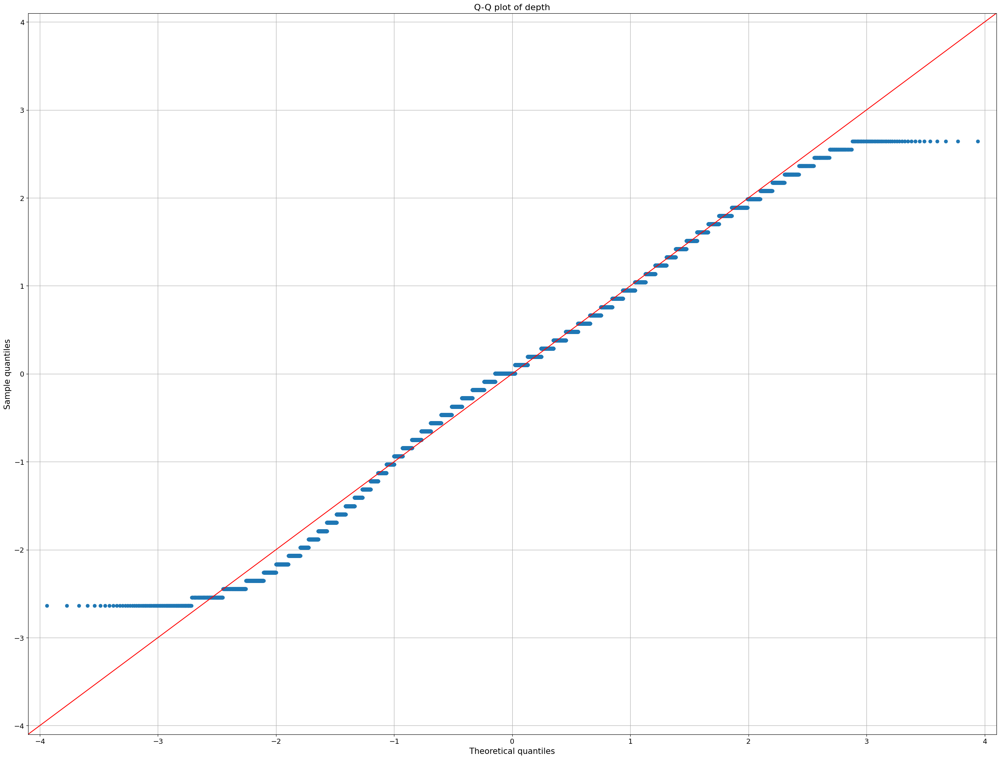

<Figure size 800x500 with 0 Axes>

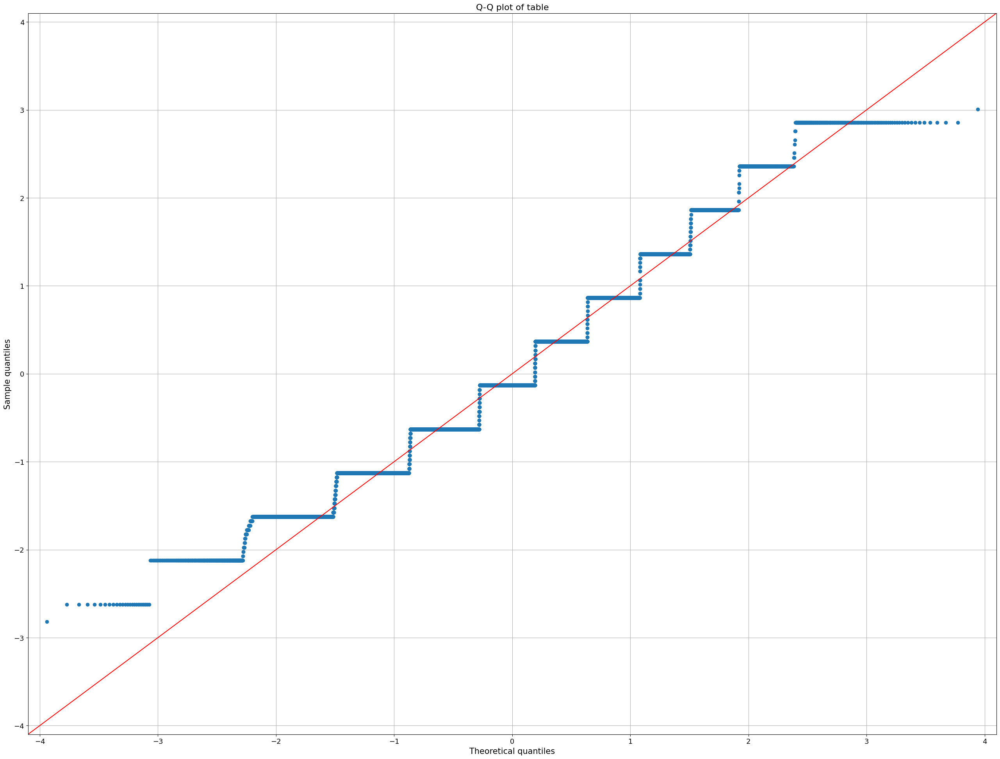

<Figure size 800x500 with 0 Axes>

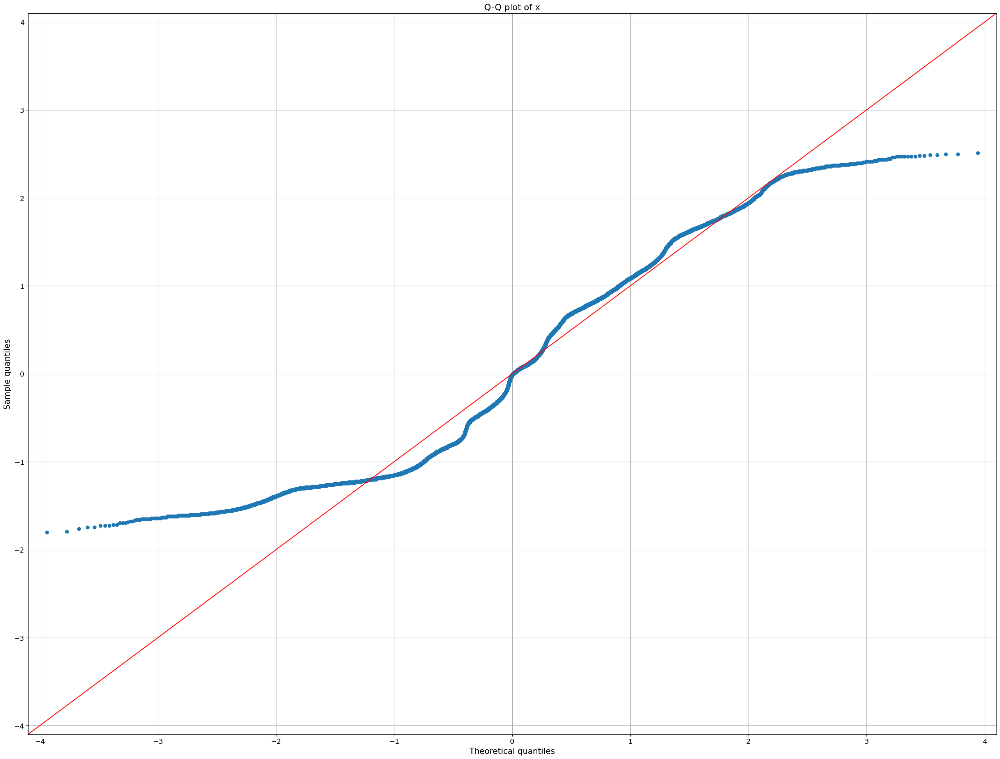

<Figure size 800x500 with 0 Axes>

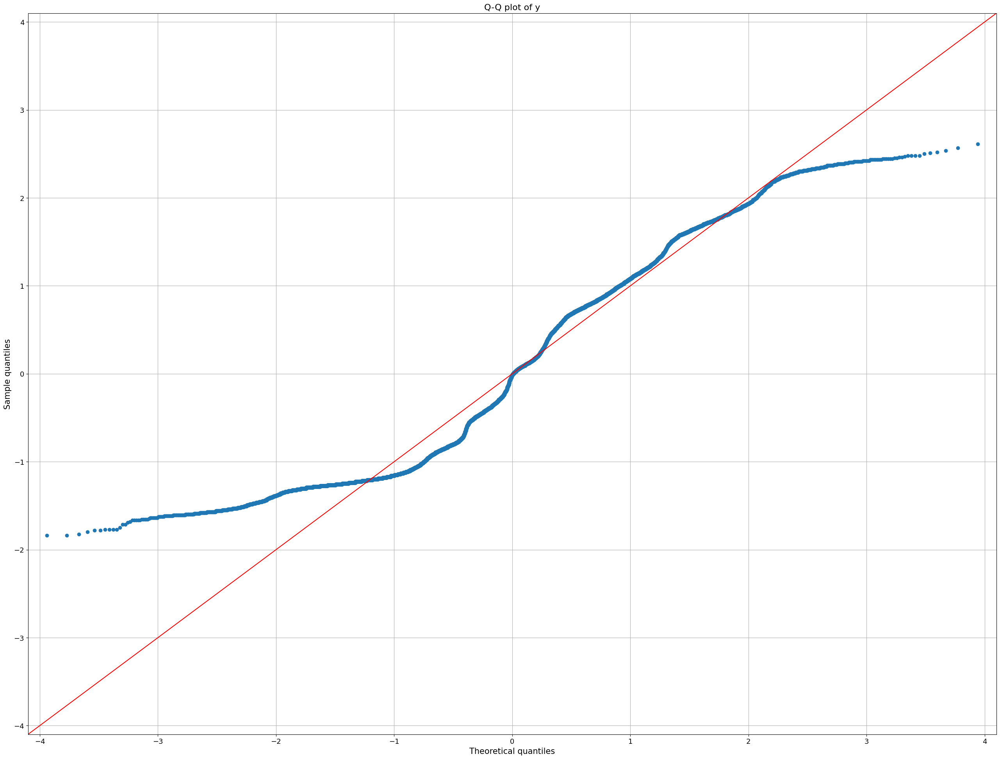

<Figure size 800x500 with 0 Axes>

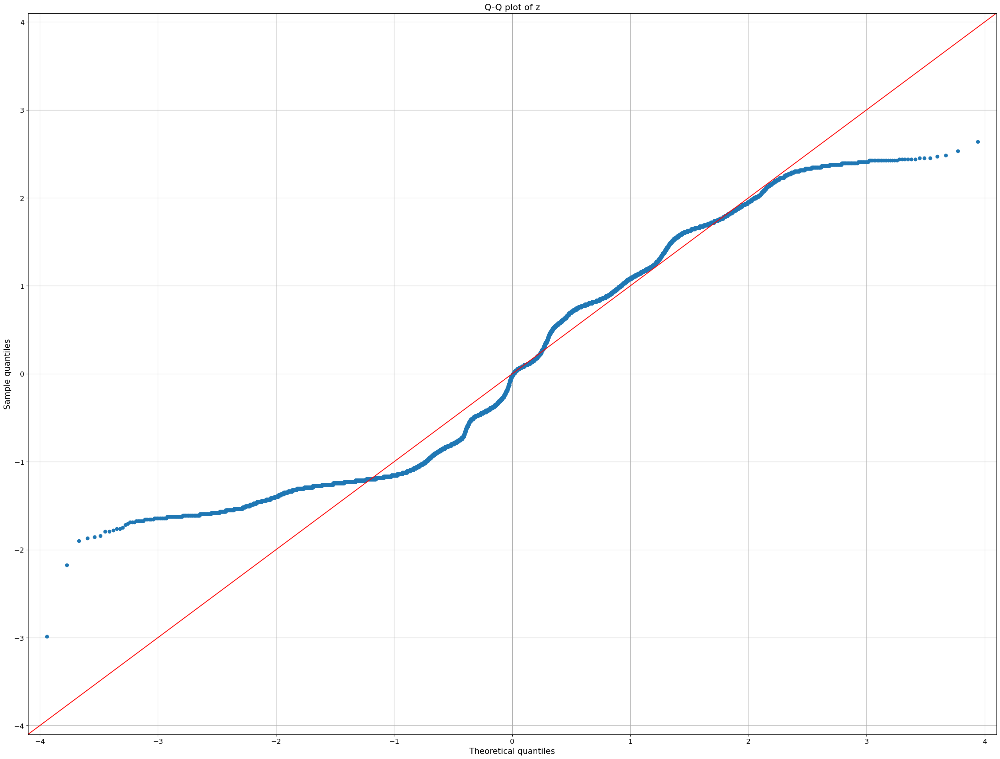

<Figure size 800x500 with 0 Axes>

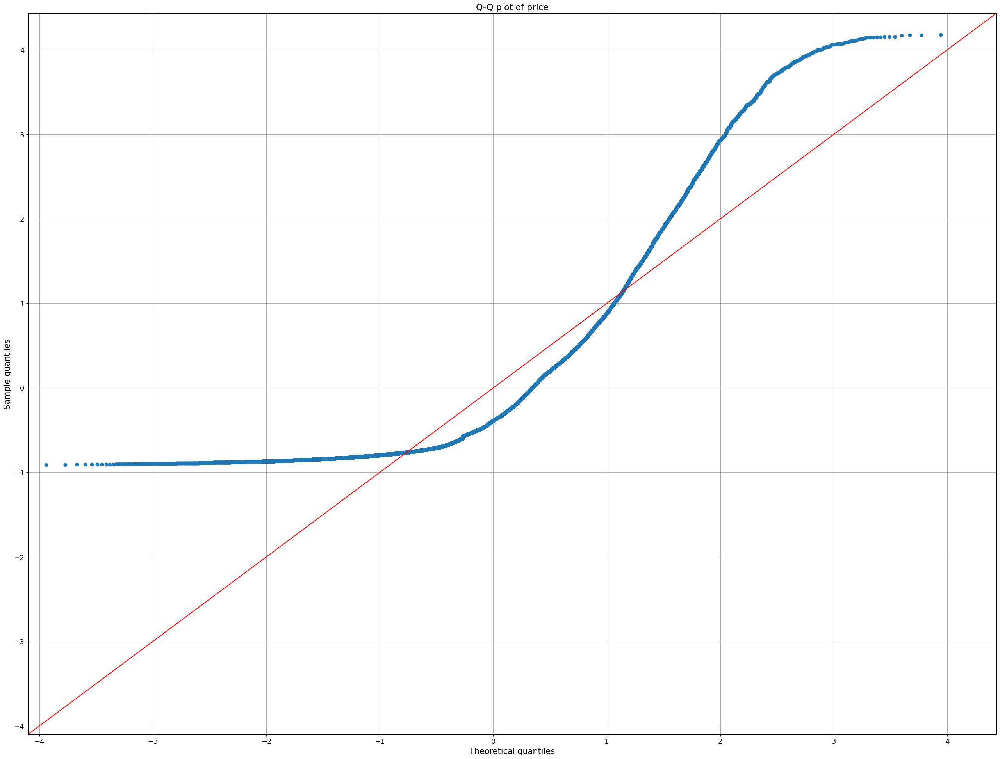

In [132]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm=cubic_df[['carat', 'depth',
       'table', 'x', 'y', 'z','price']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

### All independent variables seem to roughly follow normal distribution based on the Q-Q plots.

# Feature Engineering

In [133]:
#One hot encoding
cat_feature=[feature for feature in cubic_df.columns if cubic_df[feature].dtype=='O']
print(cat_feature)

['cut', 'color', 'clarity']


In [134]:
cubic_df['cut'].unique()

array(['Ideal', 'Premium', 'Very Good', 'Good', 'Fair'], dtype=object)

In [135]:
cubic_df['cut']=cubic_df['cut'].map({"Ideal":0,'Premium':1,"Very Good":2,'Good':3,"Fair":4})

In [136]:
print(cubic_df['color'].unique())
print(cubic_df['clarity'].unique())

['E' 'G' 'F' 'D' 'H' 'J' 'I']
['SI1' 'IF' 'VVS2' 'VS1' 'VVS1' 'VS2' 'SI2' 'I1']


In [137]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()

In [138]:
for feature in ['color','clarity']:
    cubic_df[feature]=labelencoder.fit_transform(cubic_df[feature])
cubic_df

,carat,cut,color,clarity,depth,table,x,y,z,price
0,0.30,0,1,2,62.1,58.0,4.27,4.29,2.66,499
1,0.33,1,3,1,60.8,58.0,4.42,4.46,2.70,984
2,0.90,2,1,7,62.2,60.0,6.04,6.12,3.78,6289
3,0.42,0,2,4,61.6,56.0,4.82,4.80,2.96,1082
4,0.31,0,2,6,60.4,59.0,4.35,4.43,2.65,779
...,...,...,...,...,...,...,...,...,...,...
26962,1.11,1,3,2,62.3,58.0,6.61,6.52,4.09,5408
26963,0.33,0,4,1,61.9,55.0,4.44,4.42,2.74,1114
26964,0.51,1,1,5,61.7,58.0,5.12,5.15,3.17,1656
26965,0.27,2,2,7,61.8,56.0,4.19,4.20,2.60,682


# Data Normalization

In [139]:
# One Hot Encoding
dummies_variables = ['cut', 'color', 'clarity']
dummies = pd.get_dummies(cubic_df[dummies_variables], drop_first= True)

data = pd.concat([cubic_df, dummies], axis=1)
data = data.drop(['cut', 'color', 'clarity'],axis=1)

from sklearn.preprocessing import MinMaxScaler

# Scaling of Numerical Features
scaler = MinMaxScaler()

num_vars = ['carat', 'depth', 'table', 'x', 'y', 'z', 'price']
data[num_vars] = scaler.fit_transform(data[num_vars])

In [140]:
#data after nromalizing and feature creation
data.head()

,carat,depth,table,x,y,z,price
0,0.054945,0.553571,0.547009,0.118421,0.123932,0.307065,0.009355
1,0.071429,0.321429,0.547009,0.151316,0.160256,0.317935,0.035583
2,0.384615,0.571429,0.717949,0.506579,0.514957,0.611413,0.322464
3,0.120879,0.464286,0.376068,0.239035,0.232906,0.388587,0.040883
4,0.060440,0.250000,0.632479,0.135965,0.153846,0.304348,0.024497


# Identifying predictor significance
### Using OLS for finding the p value to check the significant features

In [141]:
#Identifing predictor significance
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(cubic_df['price'], cubic_df[['carat', 'cut', 'color', 'clarity', 'depth',
       'table', 'x', 'y', 'z']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.945
Model:                            OLS   Adj. R-squared (uncentered):              0.945
Method:                 Least Squares   F-statistic:                          4.680e+04
Date:                Mon, 10 Apr 2023   Prob (F-statistic):                        0.00
Time:                        02:30:40   Log-Likelihood:                     -2.1052e+05
No. Observations:               24719   AIC:                                  4.211e+05
Df Residuals:                   24710   BIC:                                  4.211e+05
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
carat       1.432e+04    102.860    139.192      0.000    1.41e+04    1.45e+04
cut         -154.5390      8.911    -17.342      0.000    -172.005    -137.073
color       -284.2426      4.736    -60.015      0.000    -293.526    -274.959
clarity      257.0165      4.571     56.228      0.000     248.057     265.976
depth        129.0349      4.532     28.472      0.000     120.152     137.918
table        -33.1778      4.264     -7.781      0.000     -41.536     -24.820
x          -2604.3233    152.536    -17.073      0.000   -2903.304   -2305.343
y           2721.1137    140.744     19.334      0.000    2445.248    2996.980
z          -4022.2853    157.302    -25.571      0.000   -4330.606   -3713.965
==============================================================================
Omnibus:                     8320.037   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            95554.837
Skew:                           1.287   Prob(JB):                         0.00
Kurtosis:                      12.282   Cond. No.                     2.20e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.

Considering the significance value of 0.05

The carat has the p-value 0, which is lesser and hence it is a significant feature.

The cut has the p-value 0, which is lesser and hence it is a significant feature.

The color has the p-value 0, which is lesser and hence it is a significant feature.

The Clarity has the p-value 0, which is lesser and hence it is a significant feature.

The Depth has the p-value 0, which is lesser and hence it is a significant feature.

The Table has the p-value 0, which is lesser and hence it is a significant feature.

The x has the p-value 0, which is lesser and hence it is a significant feature.

The y has the p-value 0, which is lesser and hence it is a significant feature.

The z has the p-value 0, which is lesser and hence it is a significant feature.



Is the relationship significant?

A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. P-value was calculated by two ways for this model. From the OLS method it was observed that values of p for all independent variables is 0 which indicates that all are significant. Hence for the chosen dataset it can be concluded that the relationship is significant.

## Splitting the data into training and testing

In [142]:
X = data.drop(["price"], axis=1)  # Training Feature
Y = data["price"]  # Target

In [143]:
(   
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
     

In [144]:
data.isnull().sum()

carat    0
depth    0
table    0
x        0
y        0
z        0
price    0
dtype: int64

# Fitting a Linear Model

In [145]:
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [146]:
import statsmodels.formula.api as smf  # OLS model Library

results = smf.ols(
    "price ~ carat + depth + table + x + y + z",
    data=data,
).fit()
print(results.summary())  # OLS Linear Model Summary

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                 2.528e+04
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        02:31:03   Log-Likelihood:                 29425.
No. Observations:               24719   AIC:                        -5.884e+04
Df Residuals:                   24712   BIC:                        -5.878e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1403      0.010     14.614      0.0

# Interpreting Regression Co-efficients
## Model Co-efficients

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

As seen in the co-efficient coloumn in the above table

Value for the variable carat is highest = 1.4126
Followed by y = 0.4696
High absolute values of co-efficients can be used to get an idea of the importance of variables in a linear regression. Here, as stated above carat and y seems to be the most important variables to predict target i.e. price of the gem.

Also, it signifies that Higher the value of carat and y - higher is the price of gem .

P-Values

If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant

carat

depth

table 

x

y

z

These variables have P-Value less that 0.05, hence it can be interpreted that all variables are significant variables and any change to this variables have significant impact on the target (Price of the gem).

Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 1.344, 11.498 respectively.

Durbin-Watson

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected Value between 0 to 2 indicates that there is positive auto correlation detected Value between 2 to 4 indicates that there is negatibe auto correlation detected

Here the Durbin- Watson value is 2.002, which suggests that there is no significant autocorrelation among the residuals of the regression model. This value falls within the range of 2 ± (2 / n), where n is the number of observations in the dataset.

Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 81823.755 which again re-inforces the interpretation we got from Skew and Kurtosis.

# Fit Tree Based Model

In [147]:

# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

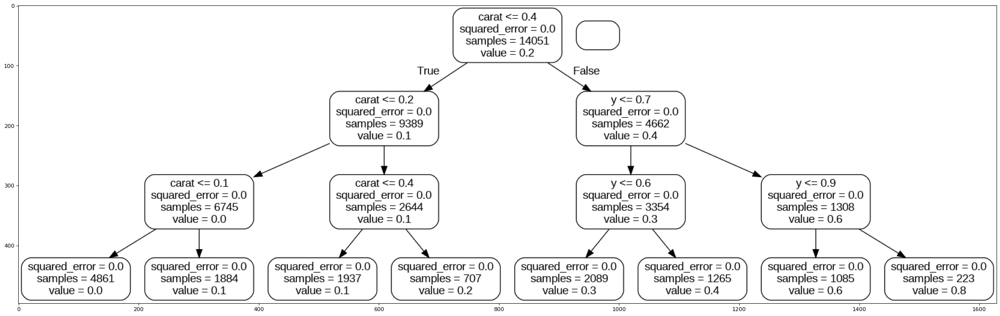

In [148]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

In [149]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [150]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: carat                Importance: 0.78
Variable: y                    Importance: 0.22
Variable: depth                Importance: 0.0
Variable: table                Importance: 0.0
Variable: x                    Importance: 0.0
Variable: z                    Importance: 0.0


# Interpreting Nodes of a Tree-Based Model


Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.


Please refer to the above figure to understand the nodes The first leaf gets gains from all parameters as the condition satisfied for all 3 parameters The second leaf gets gains from parameters 2, and 3 but not from parameters 1 And Similarly, the red marked cells are the losses incurred and Green marked cells are the gains incurred from the parameters which give us output as values for this specific decision tree


# Getting best model using H2O AutoML

In [151]:
cubic_hf = h2o.H2OFrame(cubic_df)  # Converting Pandas dataframe in H2O dataframe
     

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [152]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = cubic_hf.split_frame([pct_rows])

In [153]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "price"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [154]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [155]:

autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_1_20230410_23126,479.524,229943,247.443,0.097507,229943
StackedEnsemble_AllModels_2_AutoML_1_20230410_23126,479.715,230127,247.487,0.0973403,230127
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_23126,480.444,230827,250.492,0.0988889,230827
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_23126,480.761,231132,250.638,0.0989268,231132
GBM_2_AutoML_1_20230410_23126,484.328,234574,254.445,0.102918,234574
GBM_3_AutoML_1_20230410_23126,494.637,244666,257.768,0.103308,244666
GBM_4_AutoML_1_20230410_23126,497.496,247503,252.183,0.0947276,247503
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_23126,500.074,250074,253.436,nan,250074
GBM_1_AutoML_1_20230410_23126,513.622,263808,260.061,nan,263808
XGBoost_2_AutoML_1_20230410_23126,521.049,271493,273.106,0.104747,271493


In [156]:

autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

4
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_2_AutoML_1_20230410_23126


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    67                 67                          77638                  7            7            7             39            123           87.6567

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 152516.67094363522
RMSE: 390.53382816810534
MAE: 217.07196824410738
RMSLE: 0.09356262061000942
Mean Residual Deviance: 152516.67094363522

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 234573.5471428337
RMSE: 484.3279334736266
MAE: 254.4452642303488
RMSLE: 0.10291785233874794
Mean Residual Deviance: 234573.547142

 Does the model make sense?

For a model to make sense it should follow all the assumptions and have p value, VIF between their respective ranges. RMSE should be as low as possible considering the minimum and maximum values of the target variable. Other than that, R2 too is 0.99 which is considered excellent in terms of accuracy. So overall the model makes sense.

The above graph is a variable Importance Graph on the H20's Gradient Boosting Machine Model

We can Interpret that carat is the Most Important Variable among all with importance of 1.0 (Think as if this Importance is scaled to 100%) y is 0.98 (Think as if it is 98% Important than carat was) And So On..

In [157]:

autoML_model.predict

<bound method ModelBase.predict of H2OGradientBoostingEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'GBM_2_AutoML_1_20230410_23126', 'type': 'Key<Model>', 'URL': '/3/Models/GBM_2_AutoML_1_20230410_23126'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Frame>', 'default_value': None, '

In [158]:
X = cubic_hf.columns
print(X)

['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z', 'price']


In [159]:
# Set target and predictor variables
y = "price"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z']


The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is---

StackedEnsemble_AllModels_1_AutoML_1_20230228_174237 with an rmse score of 468.845

The second-best model is ---

StackedEnsemble_BestOfFamily_1_AutoML_1_20230228_174237 with an rmse score of 472.135


The models are then listed in descending order based on their rmse scores.

# REGULARIZATION

In this Section, we will be using the GLM model to check if regularization is helping us to improve the accuracy and reduce overfitting.

Ridge and Lasso are regularization techniques used in linear regression to prevent overfitting and improve the model's generalization ability.

Ridge regularization adds a penalty term to the least-squares objective function of the linear regression model. This penalty term is proportional to the square of the magnitude of the coefficients of the model, which shrinks the coefficients towards zero. The strength of the penalty is controlled by a hyperparameter called the regularization parameter, which needs to be tuned to achieve the best performance. Ridge regularization is particularly useful when there are many input variables that are correlated with each other, as it can help to reduce the variance of the model by reducing the effect of these correlated variables.

Lasso regularization is similar to Ridge regularization, but instead of adding a penalty term proportional to the square of the coefficients, it adds a penalty term proportional to the absolute value of the coefficients. This penalty term can set some coefficients to exactly zero, which makes Lasso regularization a useful method for feature selection. By setting some coefficients to zero, Lasso can effectively remove irrelevant variables from the model, which can lead to a simpler and more interpretable model.

The main difference between Ridge and Lasso regularization is the type of penalty function used. Ridge uses L2 regularization, while Lasso uses L1 regularization. L2 regularization tends to distribute the penalty evenly across all coefficients, while L1 regularization tends to concentrate the penalty on a smaller subset of the most important coefficients. Which method to use depends on the specific problem and the properties of the input variables.

In [160]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

cubic_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
cubic_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
cubic_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
cubic_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

This code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

The first model, "cubic_glm_regularization_ridge," is using Ridge regularization. The "family" argument is set to "gaussian," which means that the response variable is continuous and the model is using a normal (Gaussian) error distribution. The "alpha" argument is set to 0, which means that the model is using Ridge regularization. The "nfolds" argument is set to 5, which means that the model is using 5-fold cross-validation to evaluate the performance of the model.

The second model, "cubic_glm_regularization_lasso," is using Lasso regularization. The "family" and "nfolds" arguments are the same as in the Ridge model, but the "alpha" argument is set to 1, which means that the model is using Lasso regularization.

This code creates a generalized linear regression model using H2O with the option of performing lambda search for L1 and L2 regularization.

# Ridge Regularization

In [161]:
cubic_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 3.3323 ),9,9,1,py_203_sid_a28d
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,1607.5311,21.19843,1618.9785,1601.588,1611.3232,1630.9323,1574.8335
mean_residual_deviance,5476829.0,240203.61,5607257.5,5433874.5,5649399.0,5619150.5,5074463.0
mse,5476829.0,240203.61,5607257.5,5433874.5,5649399.0,5619150.5,5074463.0
null_deviance,52230111000.0000000,1736236160.0000000,53425951000.0000000,52068368000.0000000,52652306000.0000000,53665661000.0000000,49338257000.0000000
r2,0.5871645,0.0072280,0.5787897,0.5851575,0.5848388,0.5885857,0.5984509
residual_deviance,21564010500.0000000,1037758210.0000000,22501924900.0000000,21594218500.0000000,21851875300.0000000,22066405400.0000000,19805628400.0000000
rmse,2339.802,51.905758,2367.9648,2331.0674,2376.8464,2370.4749,2252.6567
rmsle,0.6828597,0.0046396,0.6855308,0.6885904,0.6763818,0.6808222,0.6829733


# Lasso Regularization

In [162]:
cubic_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 3.3323 ),9,8,1,py_203_sid_a28d
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,788.8203,11.665209,790.3356,768.76605,791.51715,798.62286,794.8598
mean_residual_deviance,1487597.1,43970.05,1447764.5,1438850.6,1508121.4,1498891.0,1544358.0
mse,1487597.1,43970.05,1447764.5,1438850.6,1508121.4,1498891.0,1544358.0
null_deviance,52228944000.0000000,2252276740.0000000,51498377000.0000000,53208568000.0000000,49516122000.0000000,51411055000.0000000,55510602000.0000000
r2,0.8877150,0.0049712,0.8904885,0.8918711,0.8794364,0.8868992,0.88988
residual_deviance,5856583700.0000000,184857488.0000000,5639042600.0000000,5752524800.0000000,5966128100.0000000,5814198300.0000000,6111024600.0000000
rmse,1219.5643,18.022596,1203.2308,1199.521,1228.0559,1224.292,1242.722
rmsle,nan,0.0,nan,nan,nan,nan,nan


Which Regularization Method Helps ?

The Ridge and Lasso regularization appears to have increased the MSE, RMSE, MAE, and RMSLE values compared to the non-regularized models, indicating worse performance. The R-squared value also decreased, indicating a worse fit to the data.

The regularization appears to have not helped in reducing the cross-validation metrics.

Regularization techniques such as Lasso and Ridge are primarily used to prevent overfitting. But here the model seems to be underfitting, so here the regularization techniques may not be the best approach.

In such cases, other model tuning techniques such as feature engineering or adjusting hyperparameters may be more effective.

Standardized coefficient magnitudes (sometimes referred to as standardized coefficients or beta coefficients) are a measure of the importance of each input variable in a predictive model, after standardizing all variables to have a mean of zero and a standard deviation of one. The values of standardized coefficient magnitudes can range from negative infinity to positive infinity, but they are typically expressed as a percentage.

The values on standardized coefficient magnitudes represent the relative importance of each input variable in the model, after taking into account the scale of the variable. A higher magnitude value indicates that the variable has a stronger impact on the outcome variable, while a lower value indicates a weaker impact.

## Interpreting Regression Co-efficients

In [163]:
train, validate, test = np.split(
    cubic_df.sample(frac=1, random_state=42), [int(0.6 * len(cubic_df)), int(0.8 * len(cubic_df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [164]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [165]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [166]:
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.gbm import H2OGradientBoostingEstimator

In [167]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [168]:
gbm_grid2.train(
    x=X, y=y, training_frame=df_train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.5,0.1,9.0,1.0,gbm_grid2_model_7,128075.9735346
,0.9,0.09,8.0,0.9,gbm_grid2_model_36,140254.2125299
,0.9,0.09,9.0,0.6000000,gbm_grid2_model_3,140278.7678989
,0.8,0.06,9.0,0.6000000,gbm_grid2_model_30,153010.7852104
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,199376.6728275
,0.4,0.08,6.0,0.9,gbm_grid2_model_28,207578.3098575
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,210912.0912384
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,228133.7898247
,0.9,0.1,4.0,0.7000000,gbm_grid2_model_15,238769.1846125
,0.7000000,0.06,5.0,0.6000000,gbm_grid2_model_14,245304.4110837


In [169]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)

In [170]:
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.5,0.1,9.0,1.0,gbm_grid2_model_7,128075.9735346
,0.9,0.09,8.0,0.9,gbm_grid2_model_36,140254.2125299
,0.9,0.09,9.0,0.6000000,gbm_grid2_model_3,140278.7678989
,0.8,0.06,9.0,0.6000000,gbm_grid2_model_30,153010.7852104
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,199376.6728275
,0.4,0.08,6.0,0.9,gbm_grid2_model_28,207578.3098575
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,210912.0912384
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,228133.7898247
,0.9,0.1,4.0,0.7000000,gbm_grid2_model_15,238769.1846125
,0.7000000,0.06,5.0,0.6000000,gbm_grid2_model_14,245304.4110837


In [171]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [172]:
models = gbm_gridperf2.models

In [173]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [174]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [175]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)
print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.5        0.10          9          1.0       1.280760e+05
1               0.9        0.09          8          0.9       1.402542e+05
2               0.9        0.09          9          0.6       1.402788e+05
3               0.8        0.06          9          0.6       1.530108e+05
4               0.5        0.05          7          0.9       1.993767e+05
5               0.4        0.08          6          0.9       2.075783e+05
6               0.8        0.03          9          0.9       2.109121e+05
7               0.9        0.03         10          0.5       2.281338e+05
8               0.9        0.10          4          0.7       2.387692e+05
9               0.7        0.06          5          0.6       2.453044e+05
10              0.6        0.10          4          1.0       2.582741e+05
11              0.5        0.10          4          0.8       2.685443e+05
12              0.9      

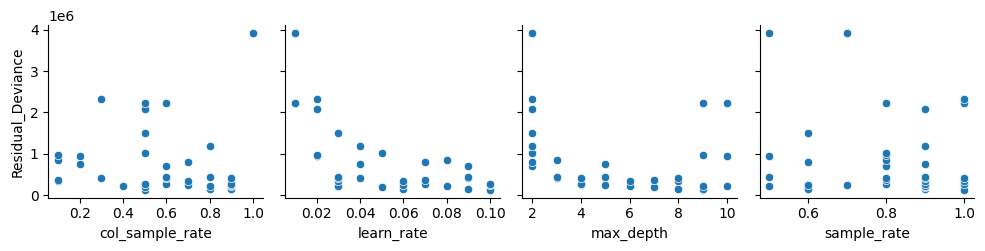

In [176]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

# Hyperparameter Tuning Analysis


This is a summary of hyperparameter tuning for an XGBoost model, which involved a grid search over a range of values for four hyperparameters: col_sample_rate, learn_rate, max_depth, and sample_rate. The search resulted in a total of 36 combinations of hyperparameters, and for each combination, the Residual Deviance was calculated as an evaluation metric.

Based on the results, the hyperparameter combination with the lowest Residual Deviance was a model with col_sample_rate of 0.5, learn_rate of 0.05, max_depth of 7, and sample_rate of 0.9, with a Residual Deviance of 2.468179.

Overall, the results suggest that the combination of col_sample_rate, learn_rate, max_depth, and sample_rate can have a significant impact on the performance of an XGBoost model, and that hyperparameter tuning can lead to significant improvements in model performance.

Which hyperparameters are important?

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset. For this model tuning is performed using RandomForestRegressor. The best hyperparameters for this model are:- col_sample_rate of 0.5, learn_rate of 0.05, max_depth of 7, and sample_rate of 0.9.

# SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

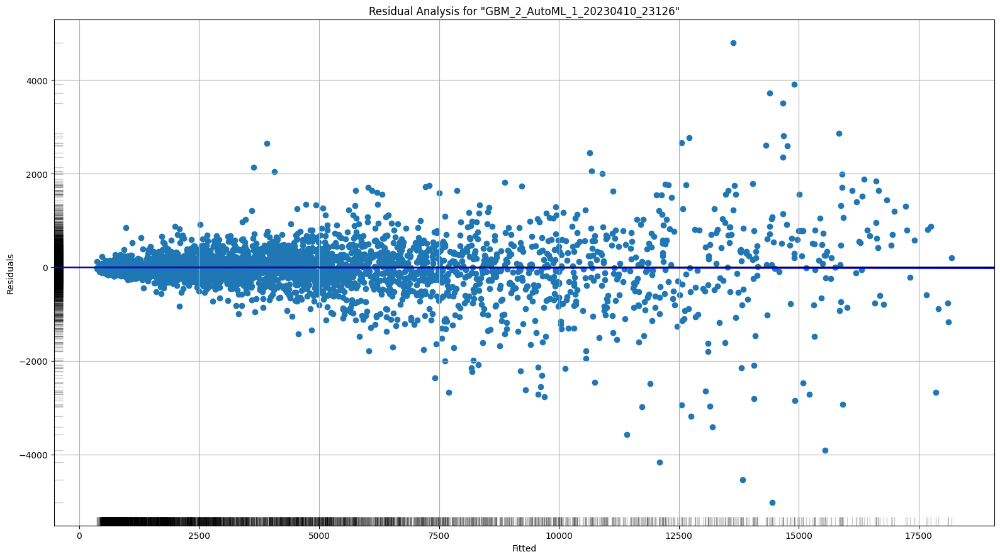

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

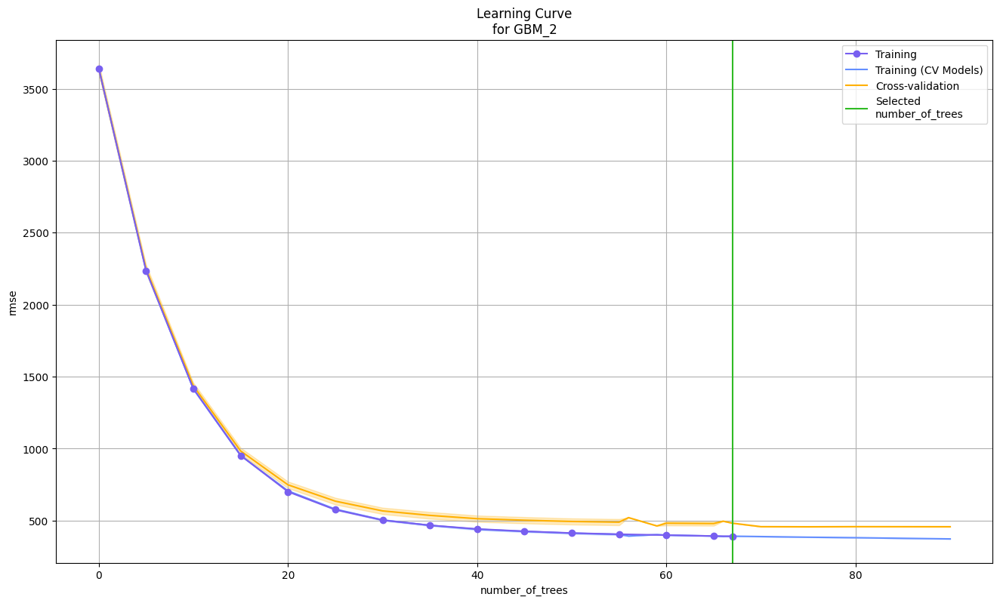

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

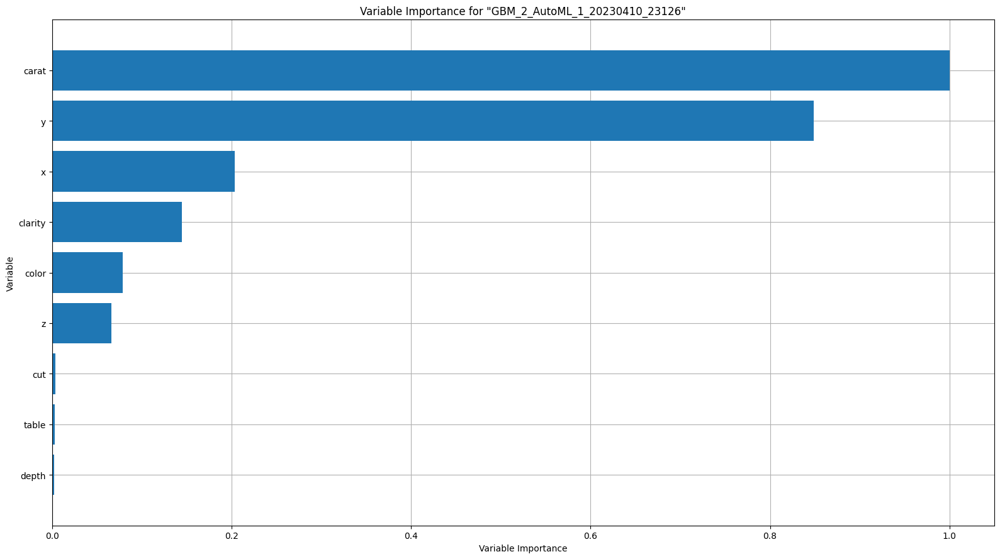

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

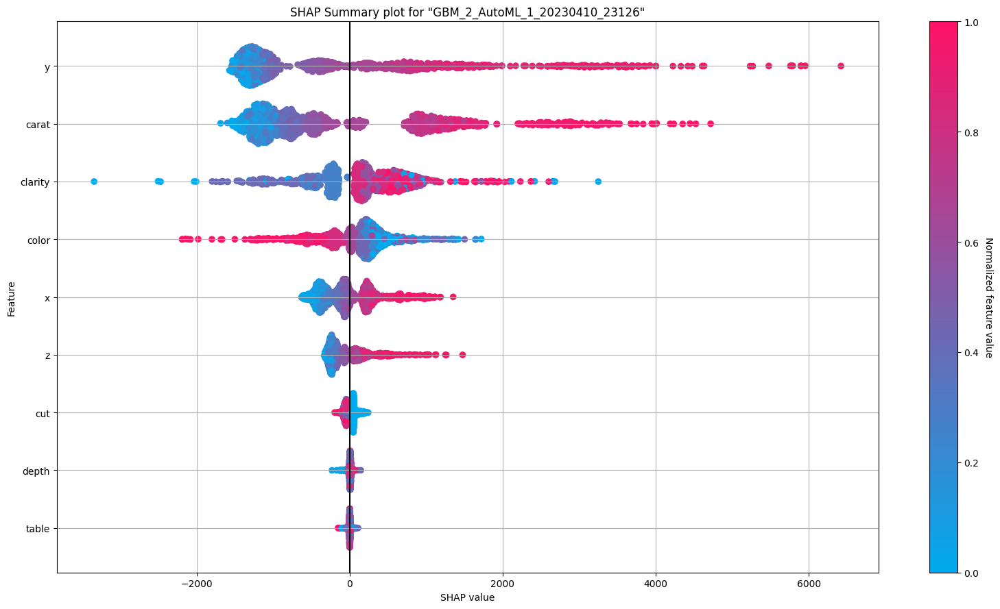

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

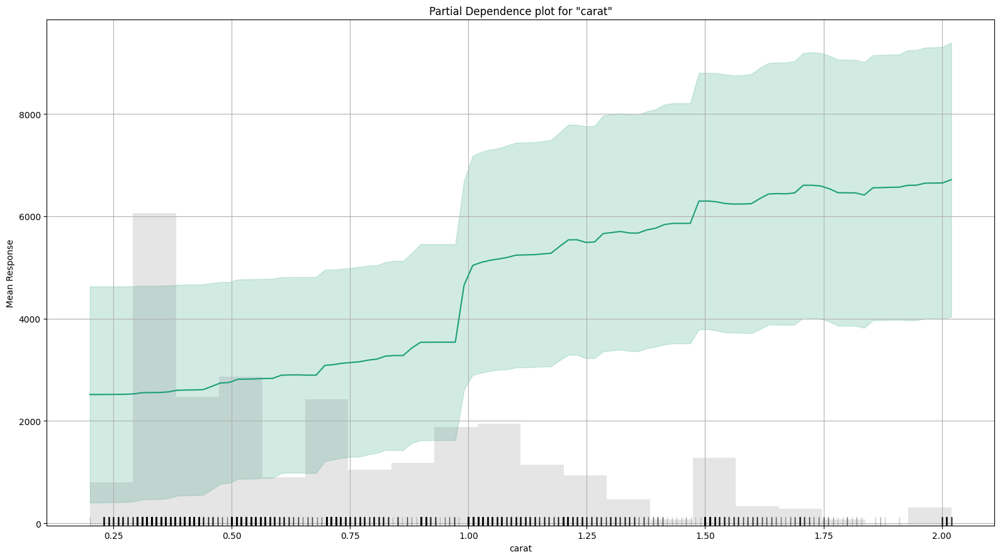

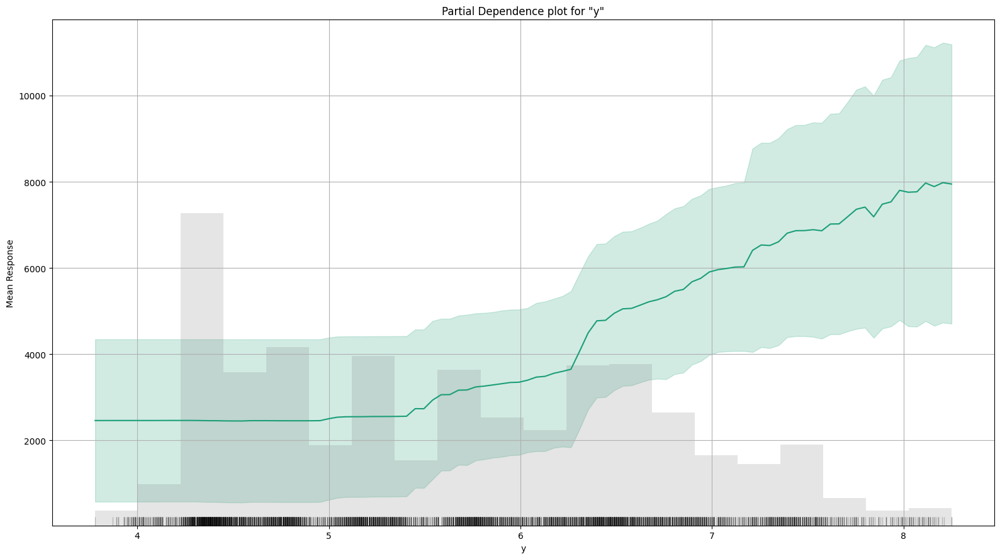

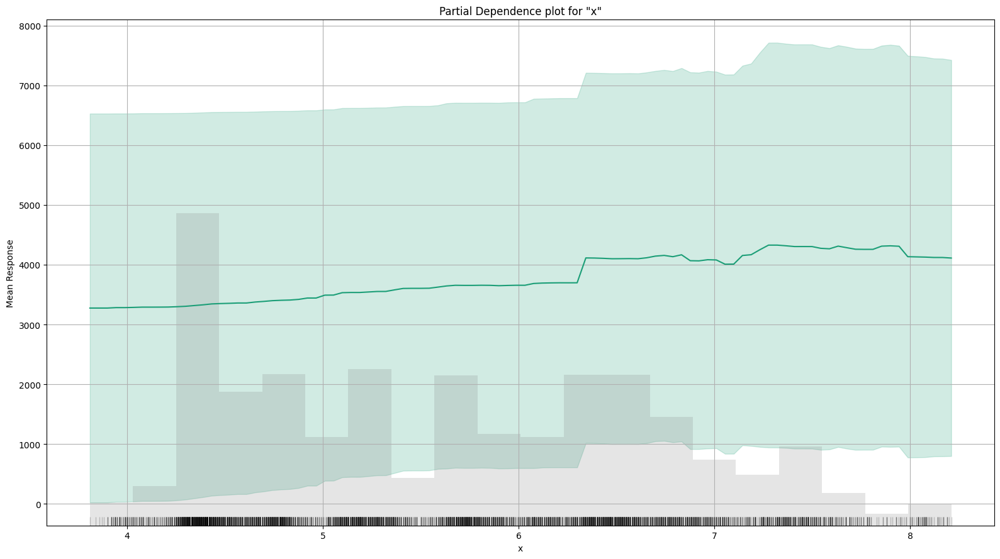

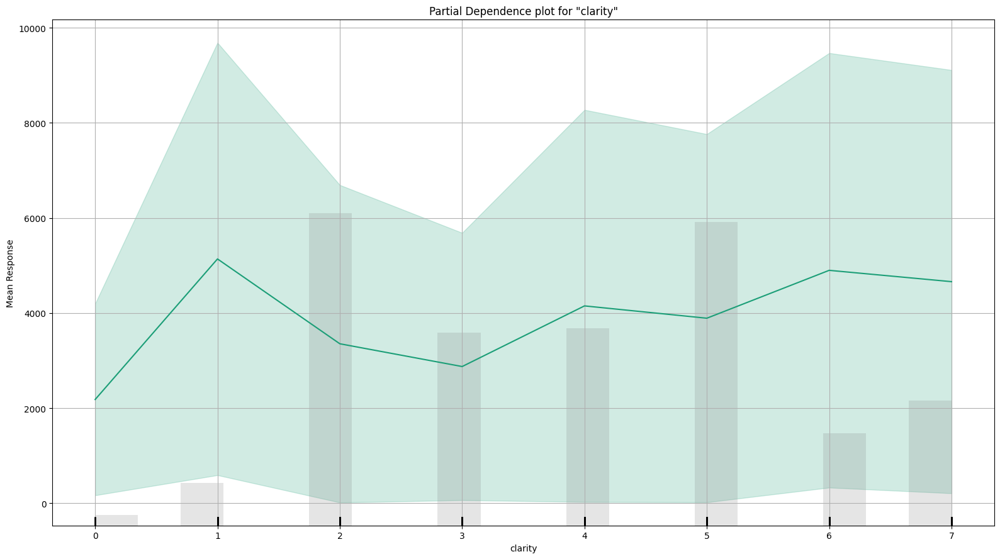

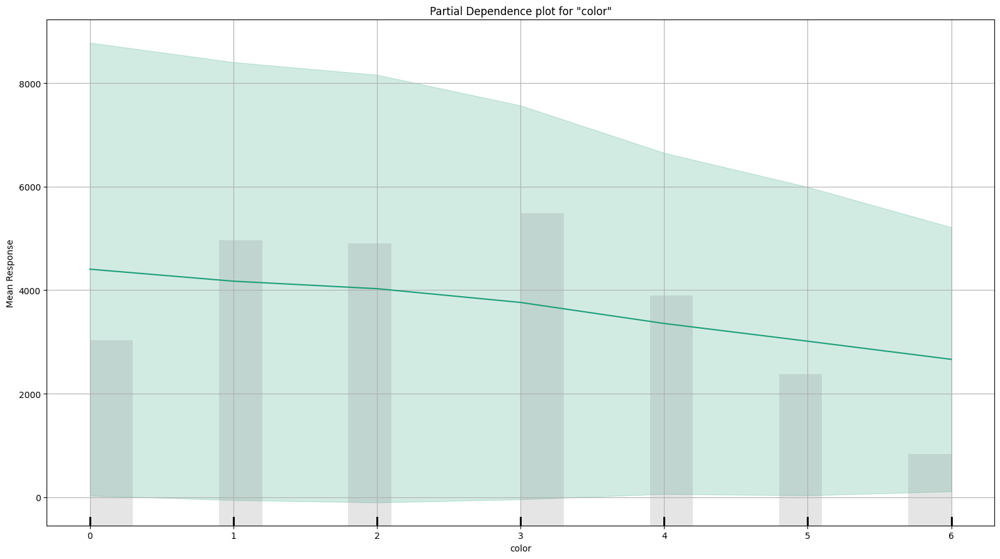

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

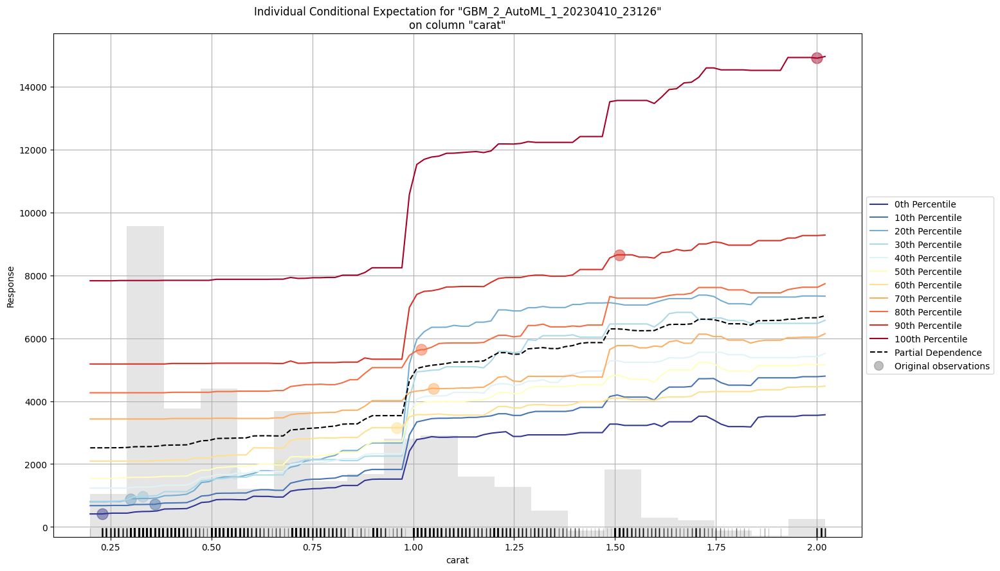

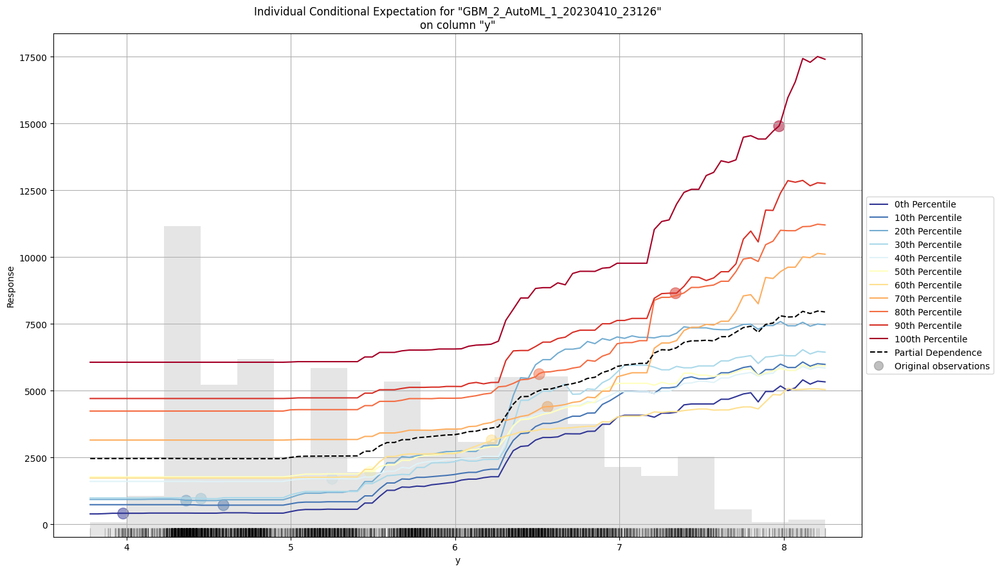

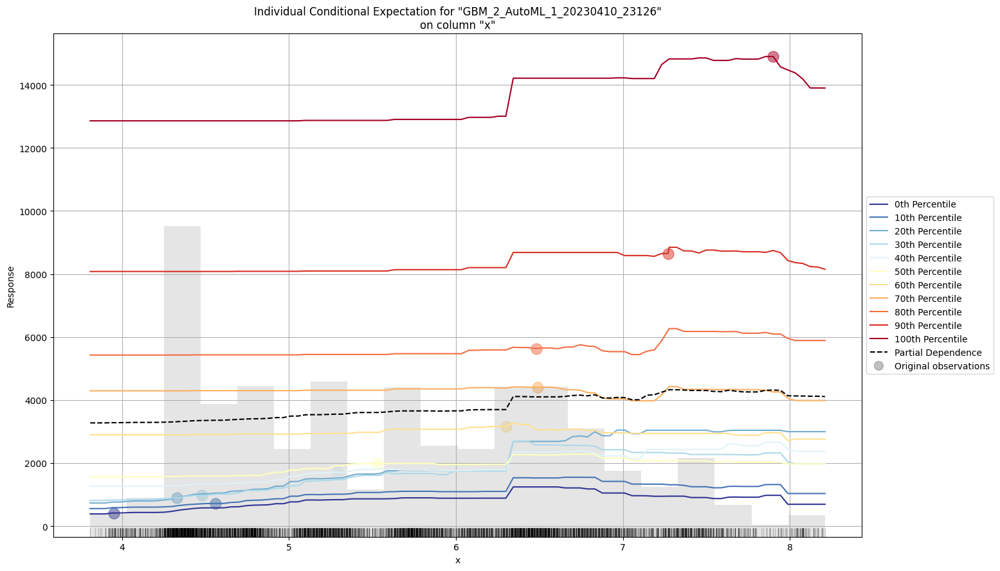

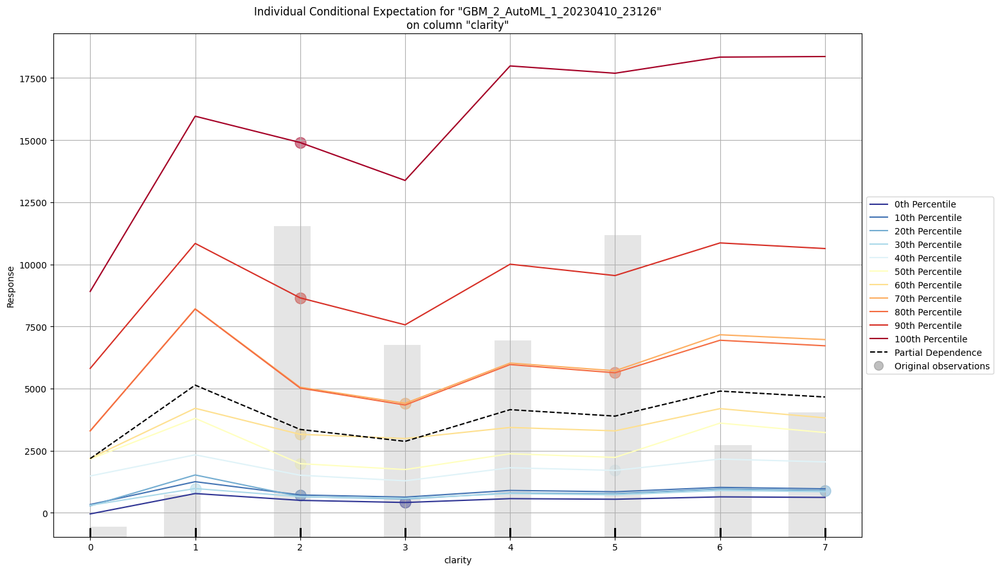

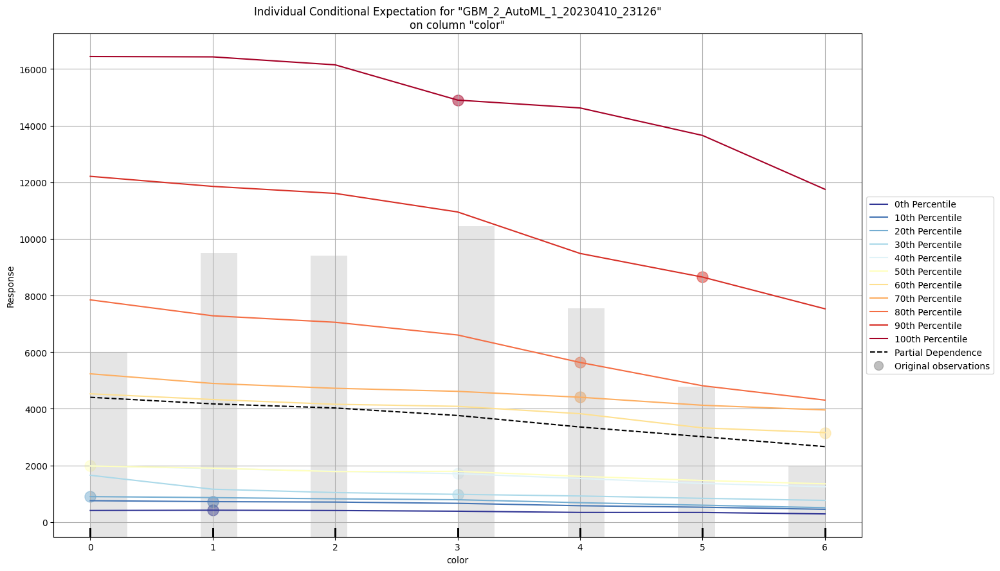

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [177]:

autoML_model.explain(autoML[1])  # AutoML Explainability

## Interpreting Best Model from AutoML


### Residual Analysis:

It can be observed from the graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

### SHAP Summary
From the SHAP summary diagram, we can interpret a few conclusions -


All the features are listed as per their importance in making the prediction, that is carat is more significant followed by y, and so on. Hence, table is the least significant predictor in our model.
The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see carat has the most impact on the price of the gem. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. i.e. - Hight amount of carat results in high price of gem, a low amount of table results in high price of gem, and so on. As we can see the distribution of red points in the carat feature is far more spread than the blue points. From this visual, we can interpret that the price of the gem vastly increases as the amount of carat increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated. Inversely for the table, less is better for the price of the gem. Let us analyze the distribution of SHAP values of this feature. As seen in the SHAP plot we can see that extreme values on both ends can have a significant effect on the price of the gem.
The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.

A partial dependence plot shows the marginal effect of a feature on the target(price in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

For Interpretation purposes, let us pick up the two most important variables - carat and y.

As we can see that when the rest of the variables are kept constant and a marginal change is made in carat, we can see the mean response increases between price levels of 1 and 1.25. This could be interpreted as this range of carat could be the deciding factor in the price of the gem.

Similarly when the rest of the variables are kept constant and a marginal change is made in y we can observe the mean response of price going up range of 5.5 to 8. Hence, it can be interpreted that this range is deciding factor in the price of the gem.

The computation of partial dependence plots is intuitive: The partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.

ICE (Individual Conditional Expectation) Plot
ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value.

Let us go back to the carat and y features, as we interpreted in PDP the price of the gem increases when carat and y value is between 1 to 1.25 and 5.5 to 8 respectively.

But is this true for every price in the dataset?

ICE plot has an answer to this question. As we can see in the ICE plot above the price of few gems(0th percentile instance) increases a lot in this range while the price of a few doesn't change much(100th Percentile Instance).

Individual conditional expectation curves are even more intuitive to understand than partial dependence plots. One line represents the predictions for one instance if we vary the feature of interest.

# SHAP Analysis for Linear and Tree-Based Models

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of fixed_acidity

For the linear model the cross is made at approx E[f(x)] -0.2
For Tree-based model the cross is made at approx E[f(x)] 0.05
So as carat increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

Exact explainer: 22248it [02:26, 140.13it/s]                           


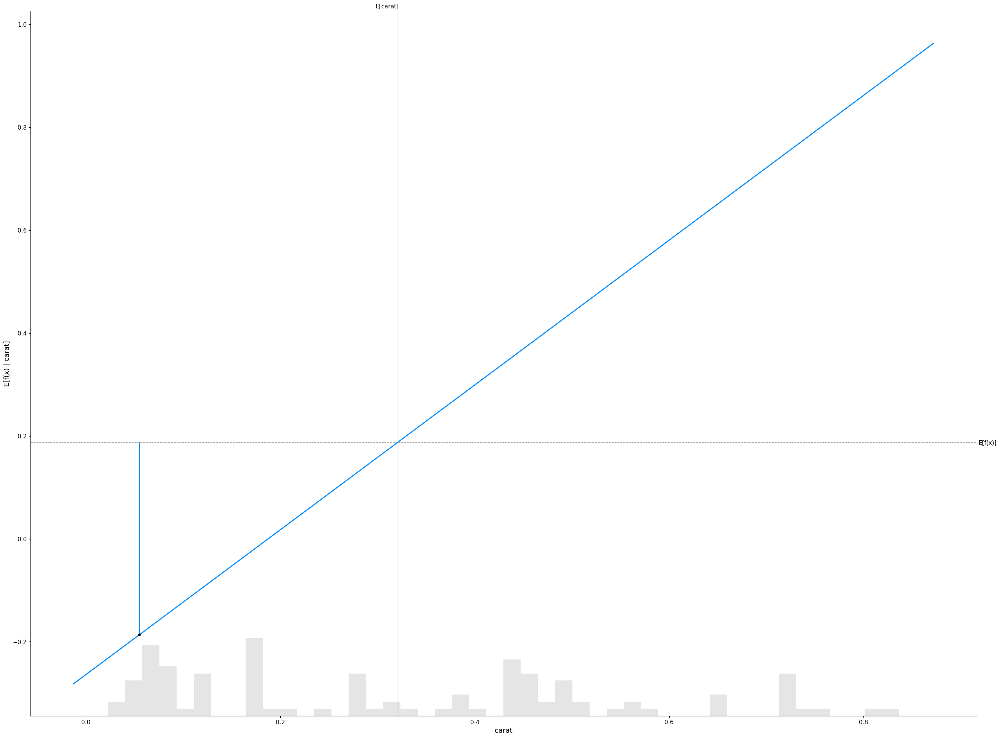

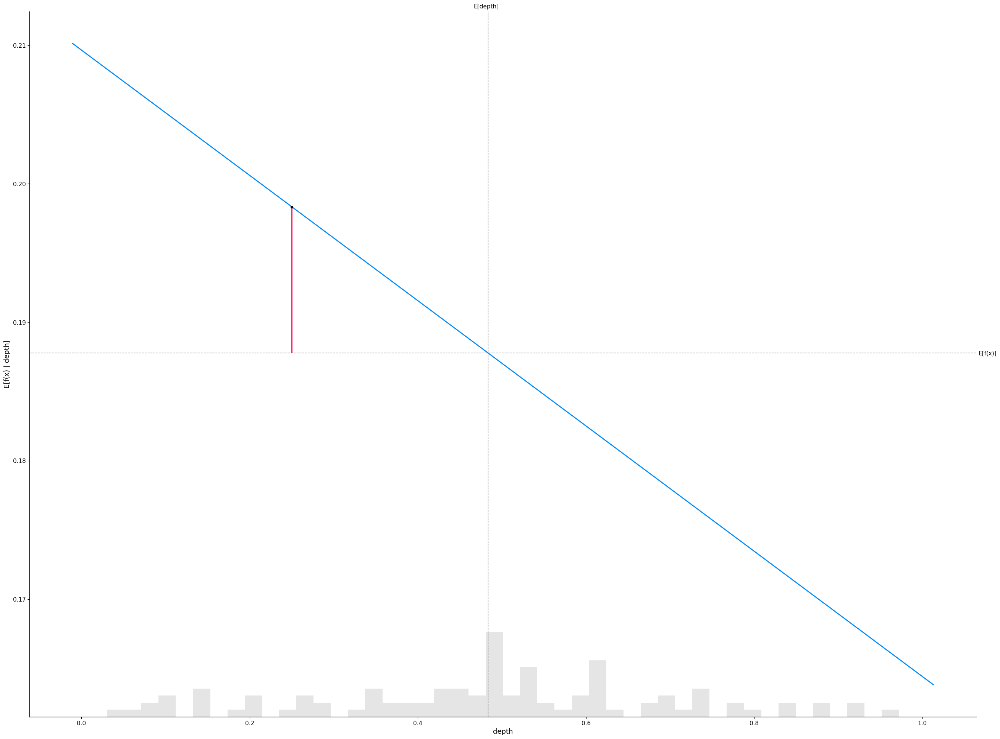

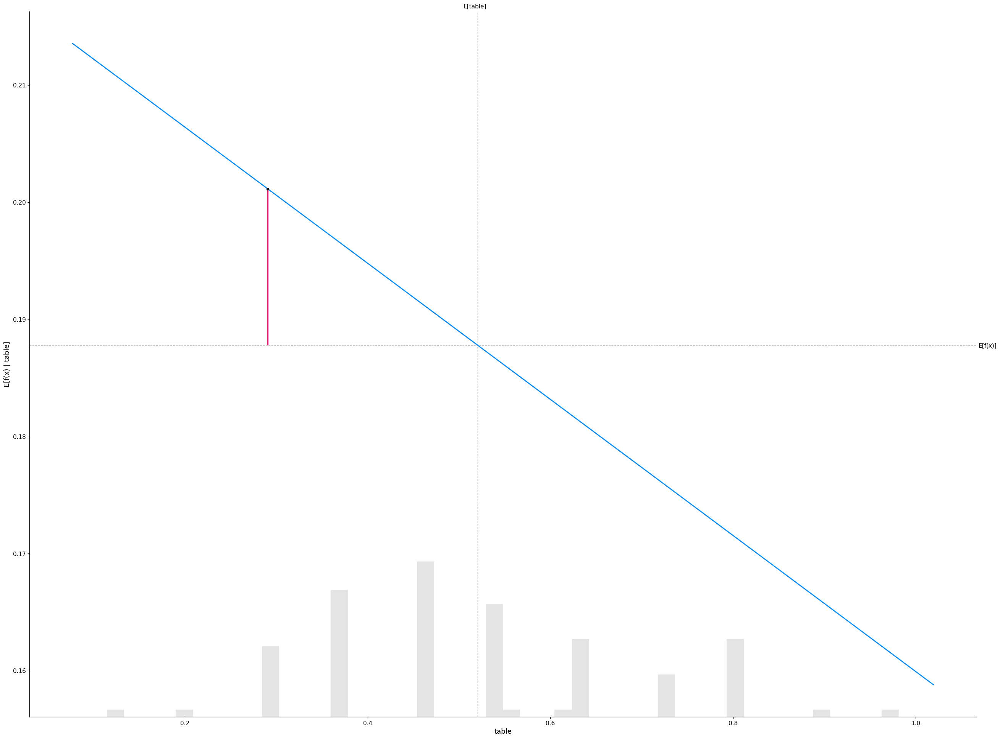

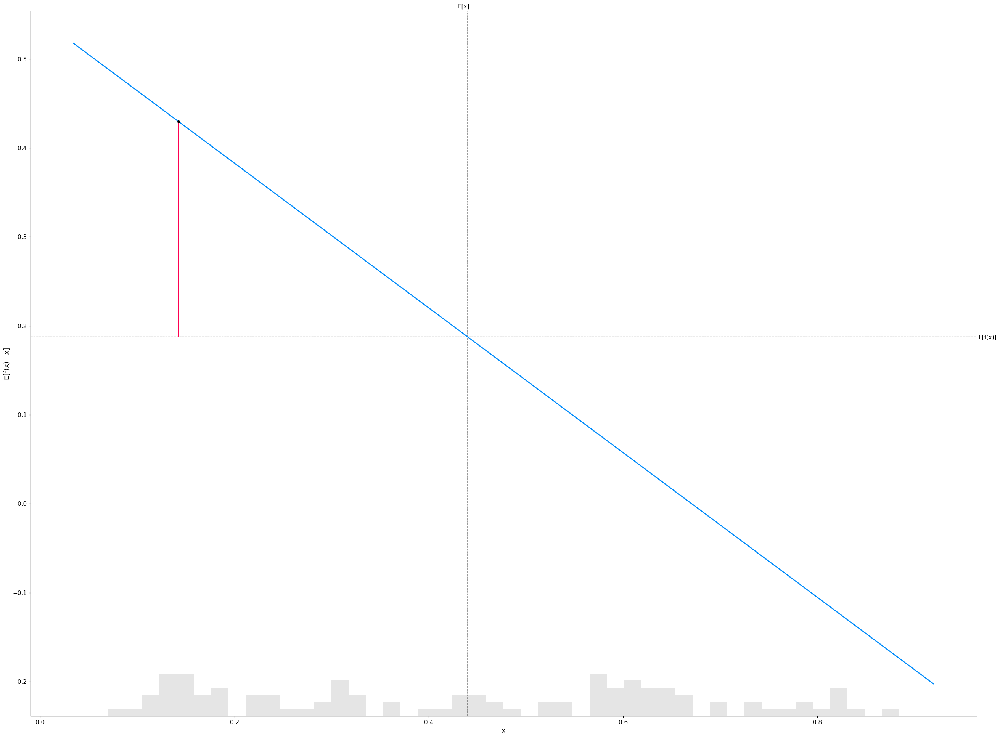

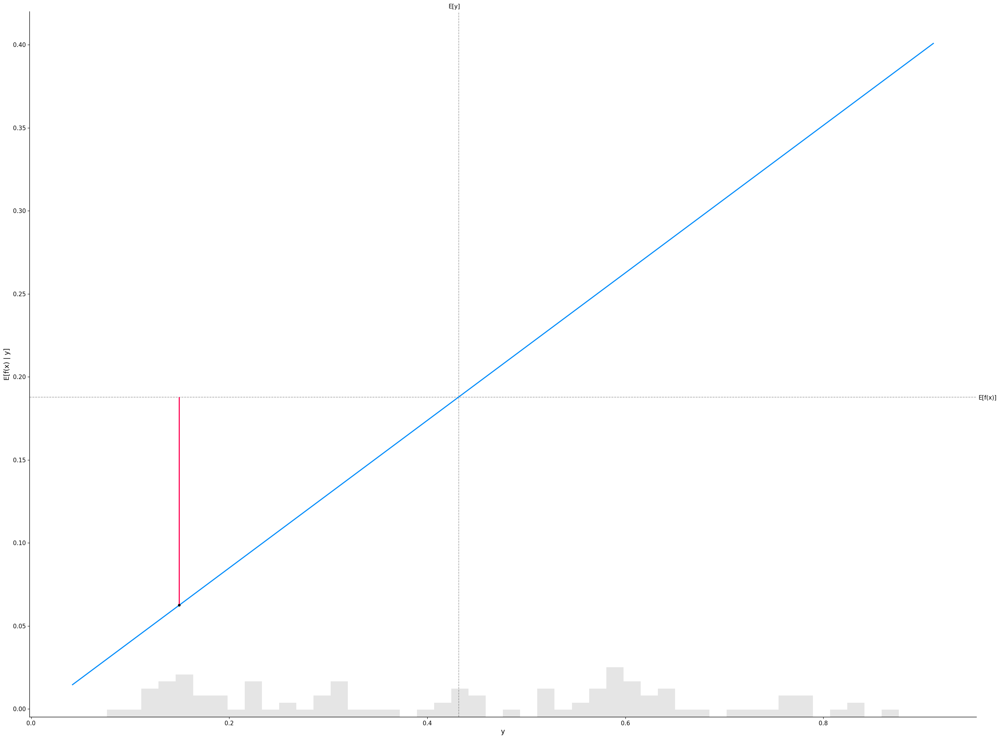

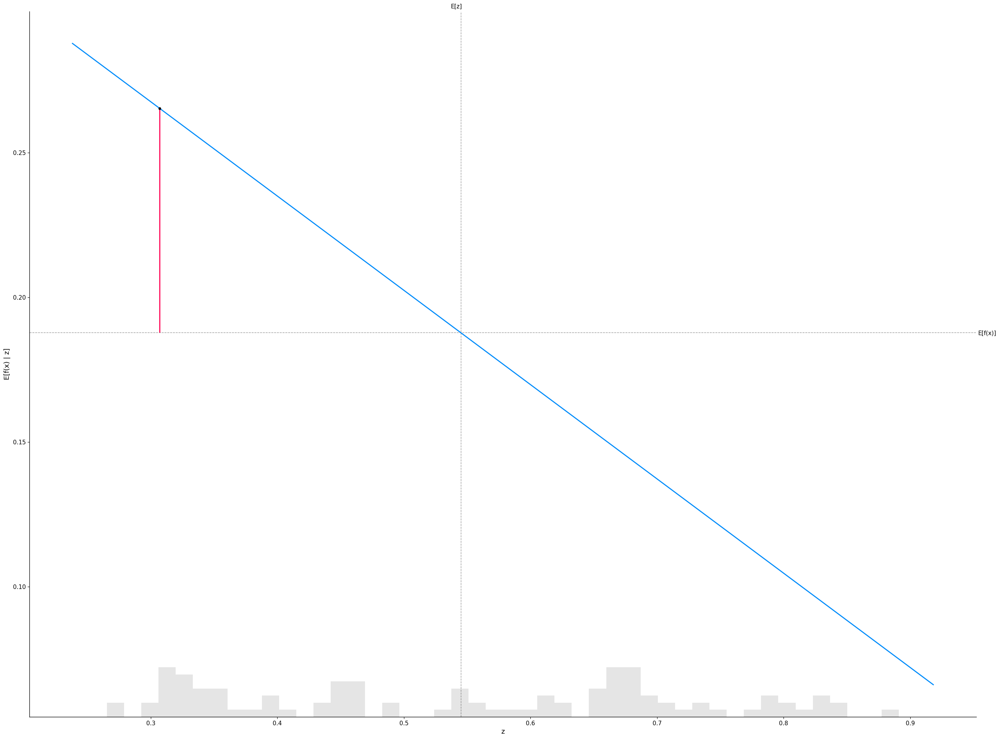

In [178]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Exact explainer: 22248it [03:11, 110.11it/s]                           


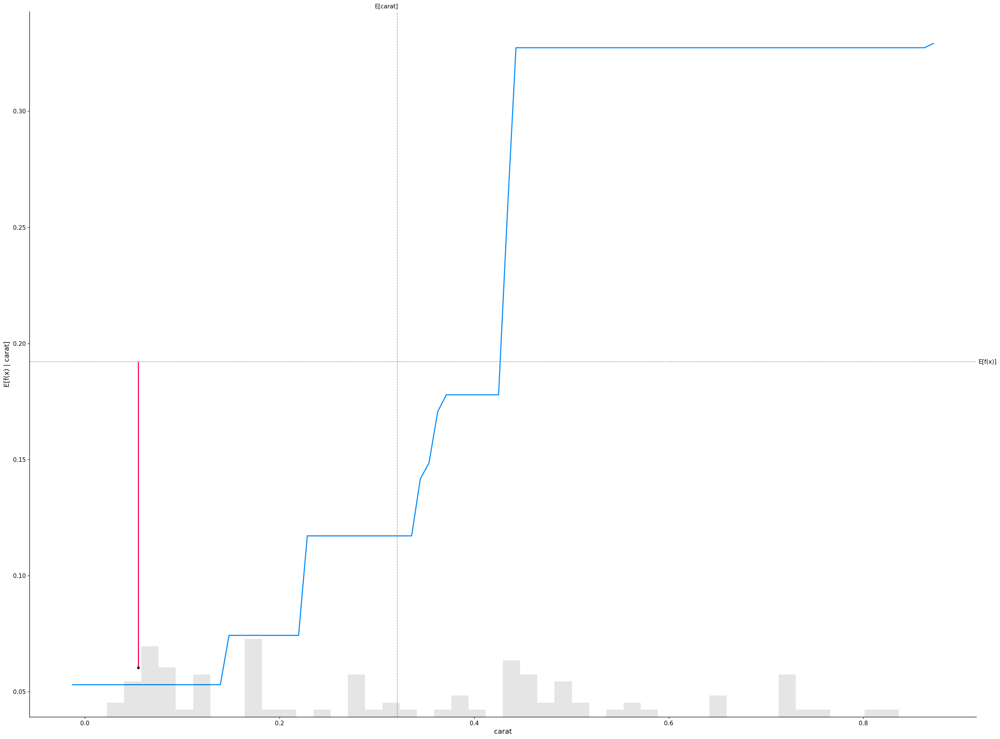

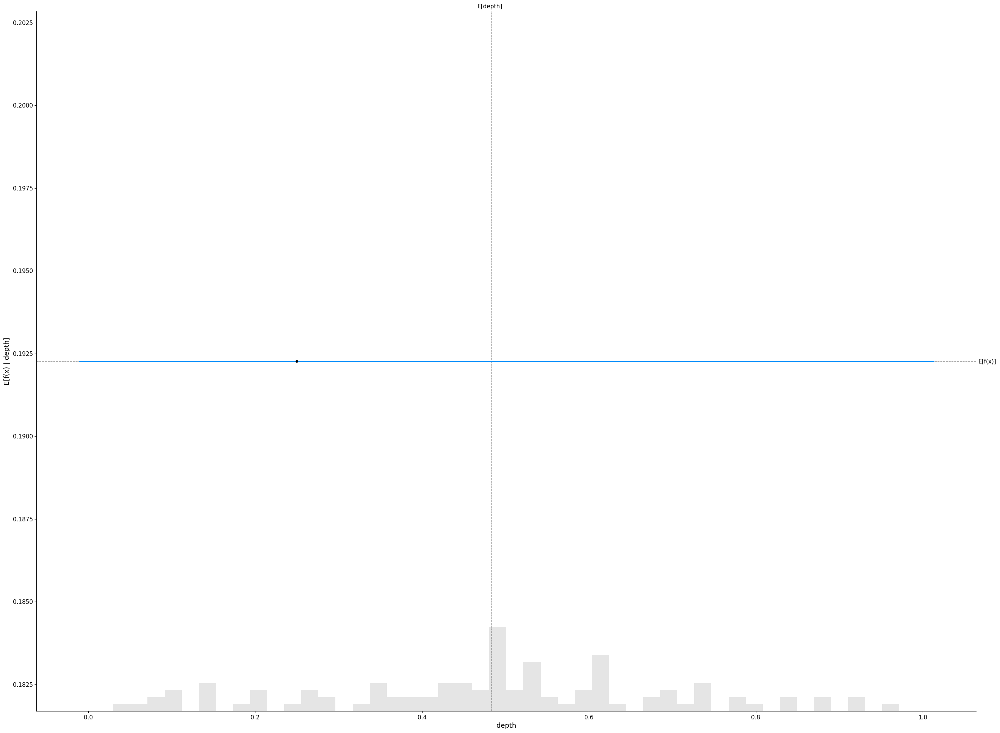

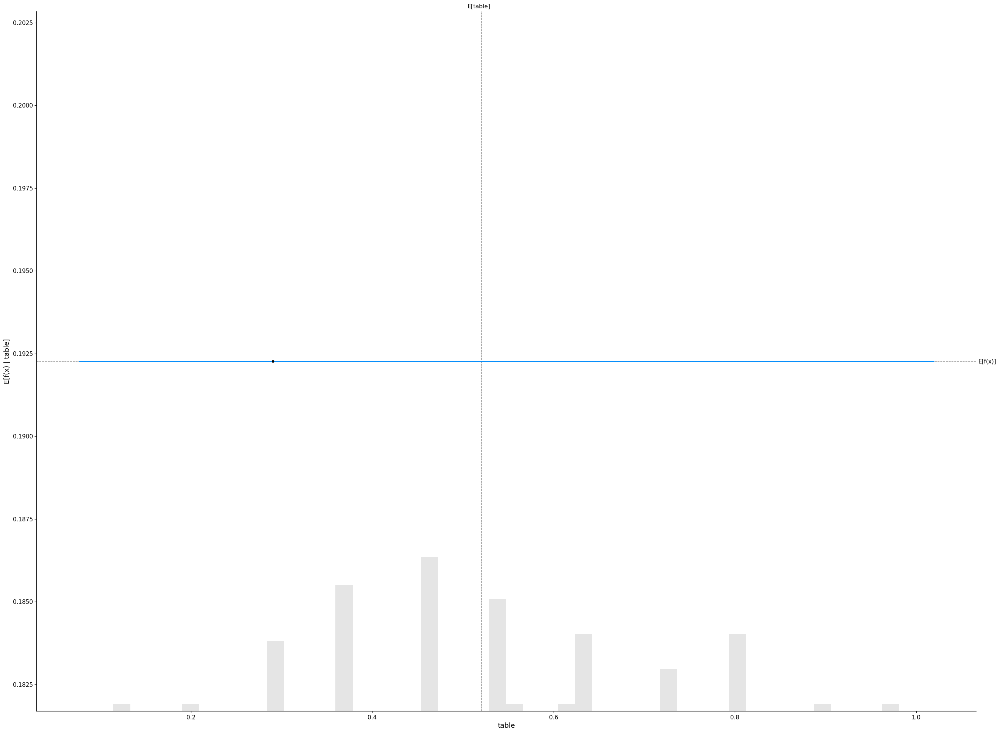

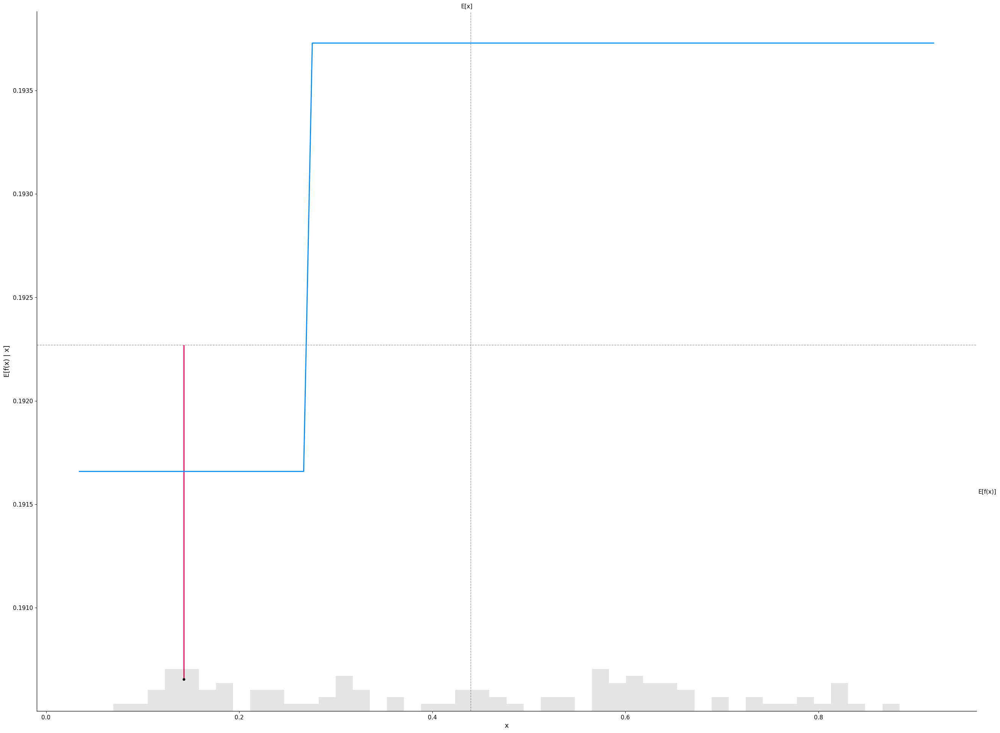

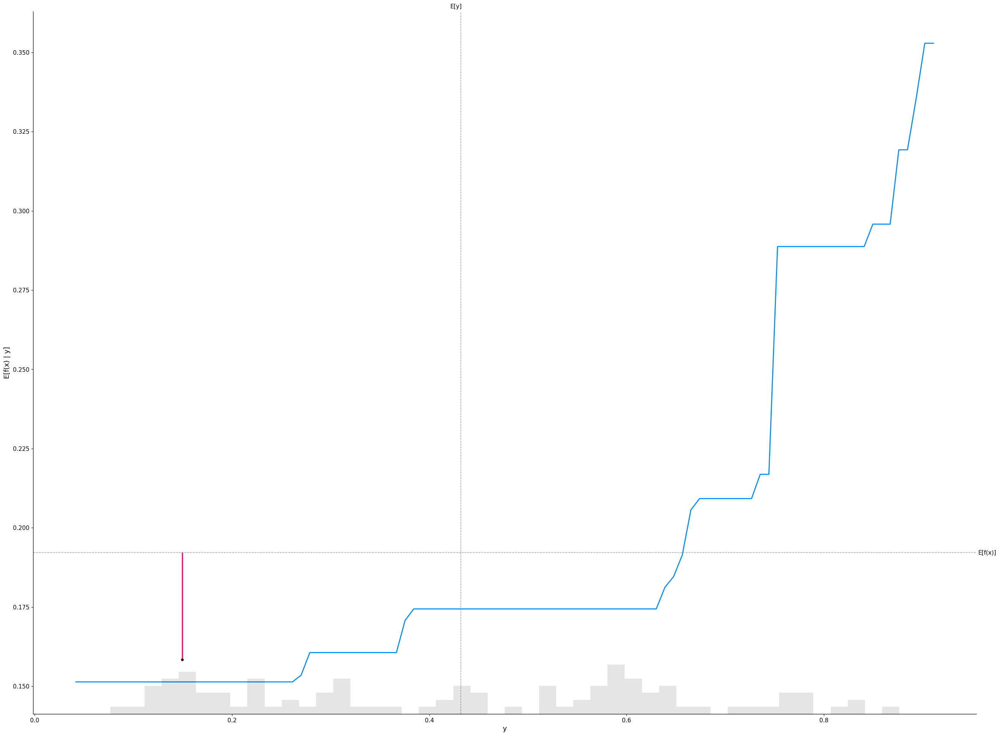

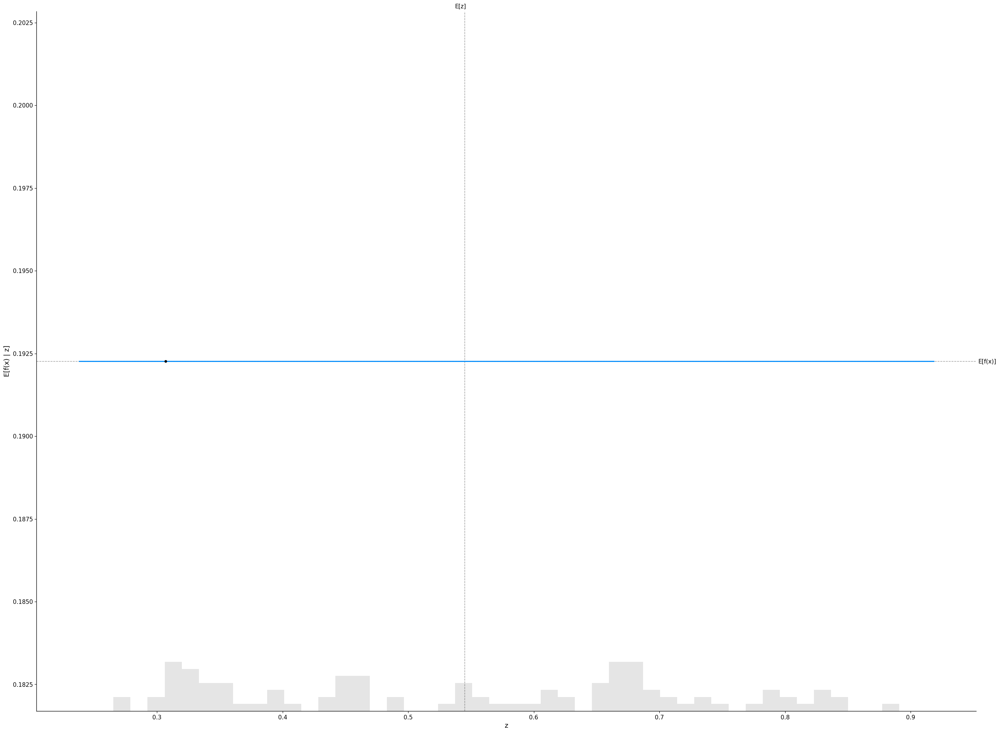

In [179]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )
     

# Interpreting SHAP Feature Importance Plot for Linear and Tree-based model
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a linear model
SHAP feature importance for tree-based model
As we can see below in the plots, there is  no difference in feature importance for both the models

For the linear model, depth is the second most important feature and for our tree-based model depth is only the second most important feature when we consider the average of SHAP values to calculate feature importance.

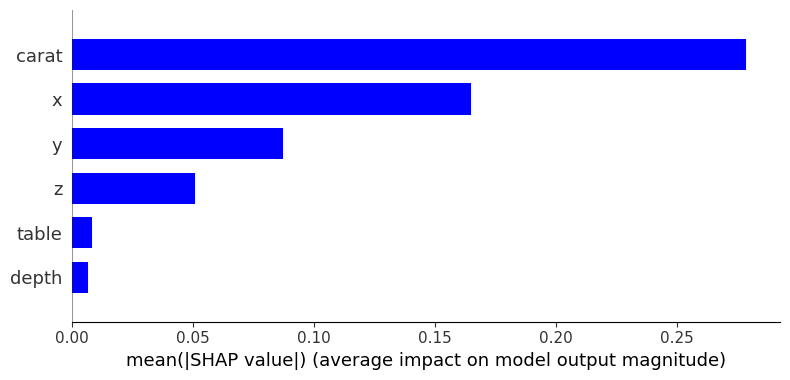

In [180]:

# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

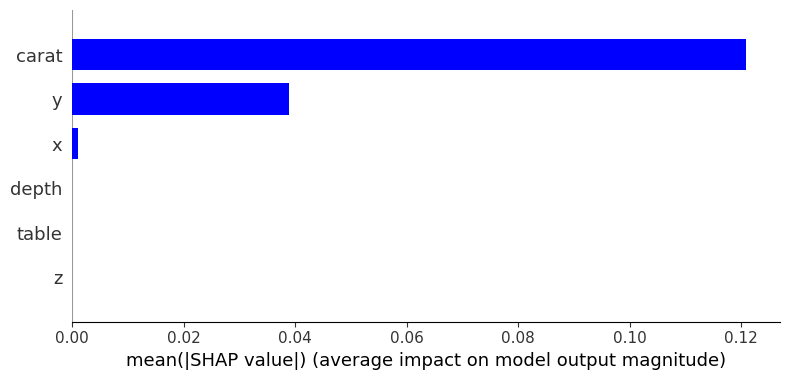

In [181]:

# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

# Interpreting Waterfall SHAP visualization
Let's consider the same sample (sample_ind = 18)
Notice the value of  in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 0.031 is what we got as a model output and the expected output for this sample was 0.188. We came pretty close to determining it as the difference is only 0.157. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that carat has the biggest and most negative impact in decreasing the price of the gem by 0.37 for this specific sample. Followed by x had a positive impact and it bought the price of the gem down again by 0.24 for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 0.031.

Similarly we can interpret the tree-based model for the same sample.
Where the output we got was 0.025 and the expected output was 0.192. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the linear model, the output is majorly determined by  features - carat, x, y, z, table, depth whereas in the tree-based model only 2 features carat and y had maximum impact.

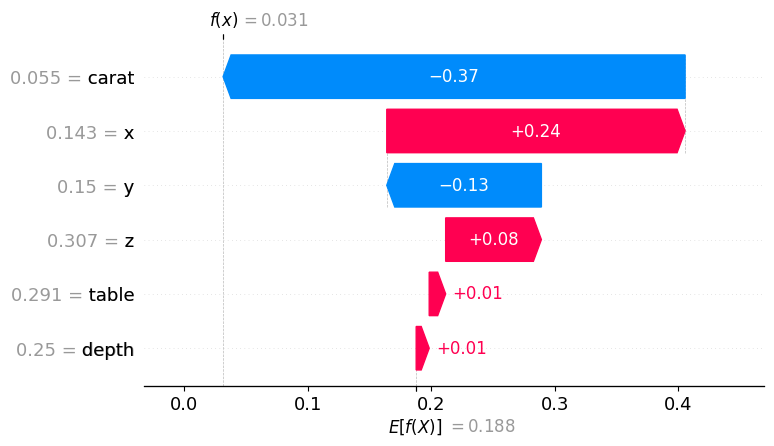

In [182]:

# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

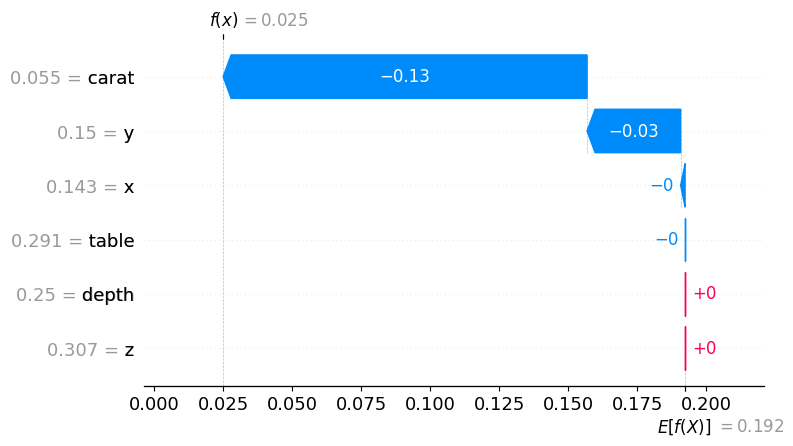

In [183]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

# Interpret the summary plot for the Linear and Tree-based model
Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Each dot(both red and blue) represents a feature of a price
Red color represents high values whereas blue color represents low value
If a dot(a feature of gem) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
The position of a dot(a feature of price) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.
Let us try to understand how both models are performing side by side

Higher value of carat tends to have a positive impact on the price of the gem
Lower values of x tend to have a positive impact on the price of the gem.
Higher values of y tends to have a positive impact on the price of the gem
Lower value of z tends to have a positive impact on the price of the gem and so on.
We could also interpret the intensity of impact

Higher amount of y have a much positive impact on the price of the gem but it doesn't really care if the value is low it will always have the same intensity of negative impact on the price
This visualization is very useful when it comes to interpreting how our model is working.

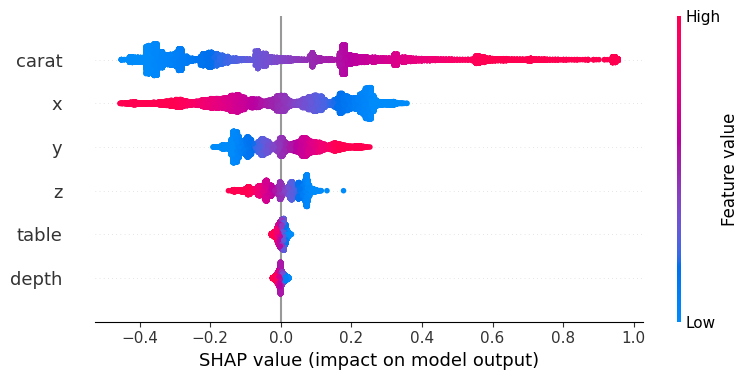

In [184]:

# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

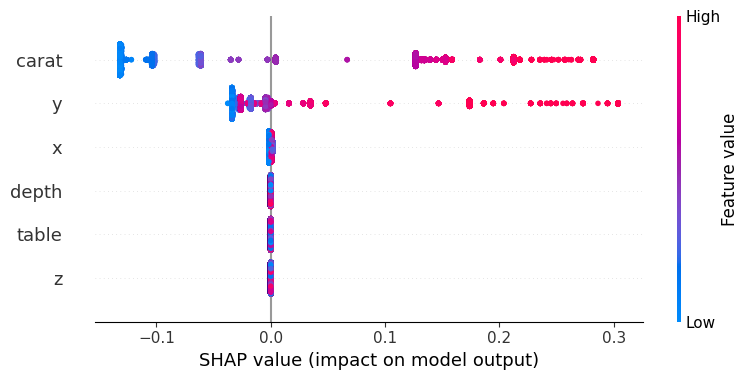

In [185]:

# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

# Interpreting SHAP dependence plot for Linear and Tree-based model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every gem in our dataset.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the price of gem then the relationship will be directly proportional e.g. carat and y and if the feature harms price of gem the relationship will be inversely proportional. 

For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. Because if we look at the PDP, we are losing all the high order interaction (and's and or's) in the model that our model may be doing. But unlike PDP, the SHAP defense plot takes these interactions into account.

Example of SHAP dependence plot of carat

In the linear model the relationship is linear between carat and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.
In the tree-based model we could extract the information on how the price of each gem is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The price of gem in the range (10 - 12) changes drastically.

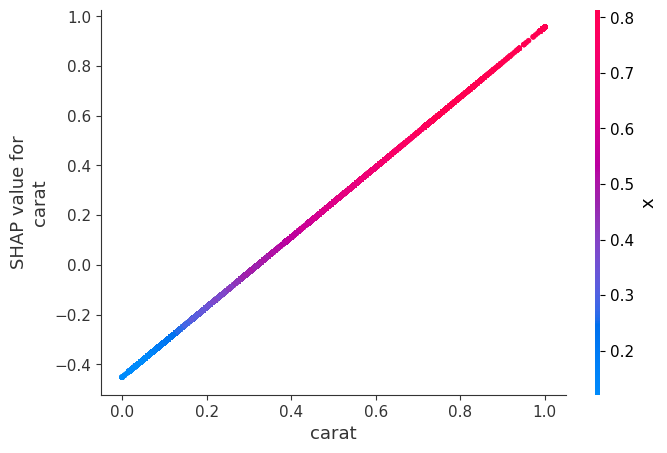

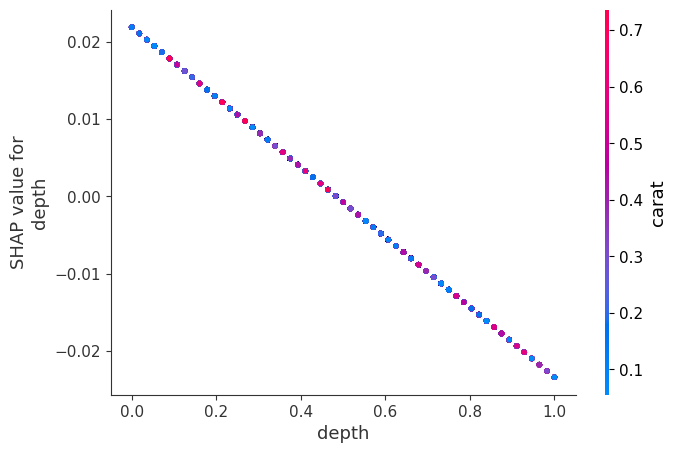

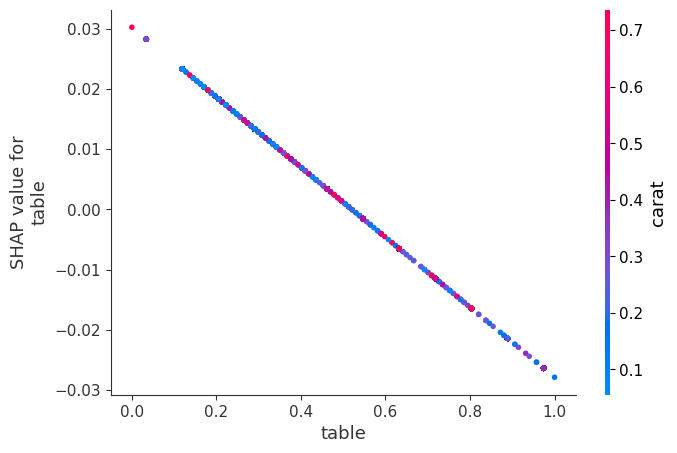

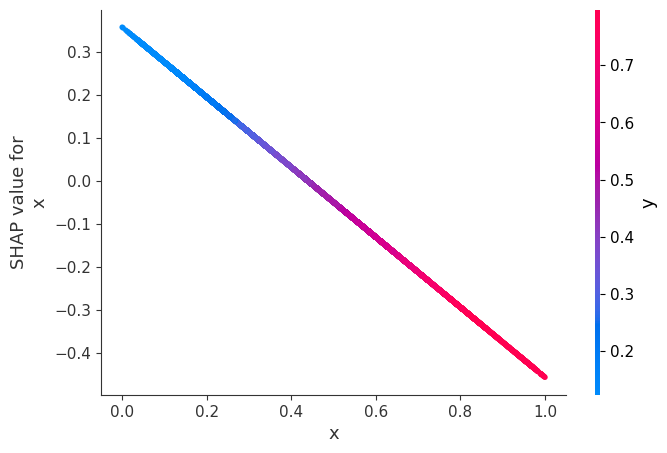

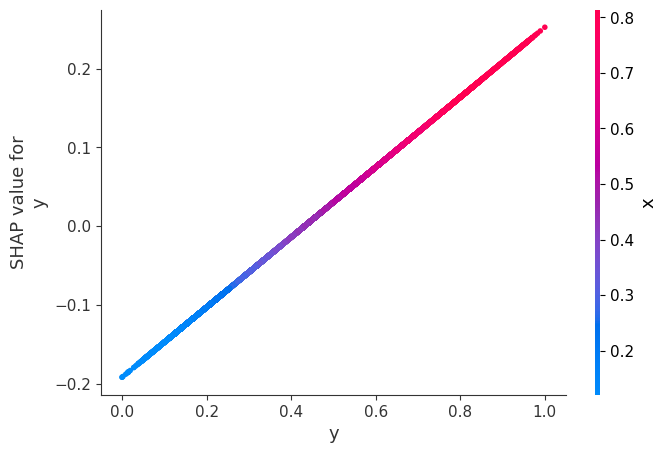

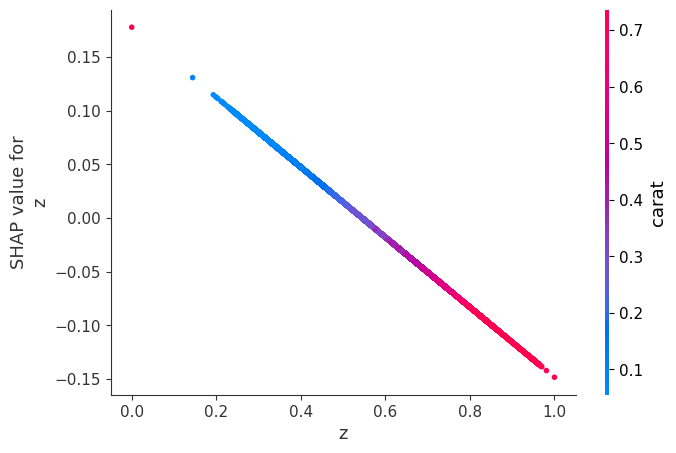

In [186]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)
     

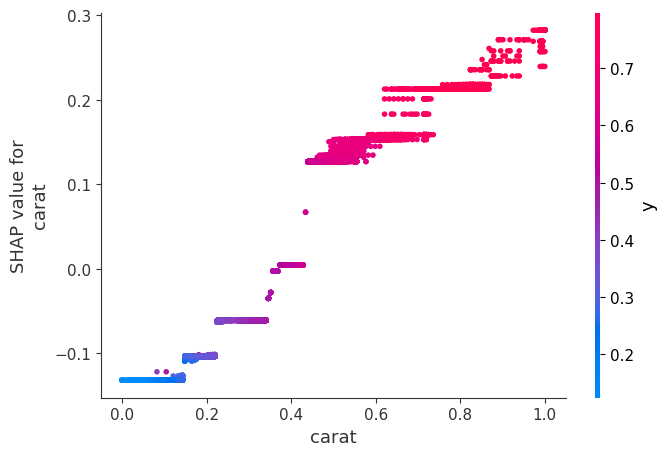

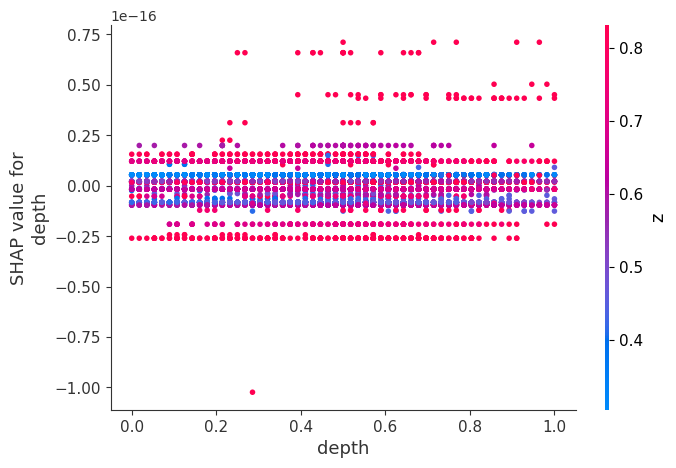

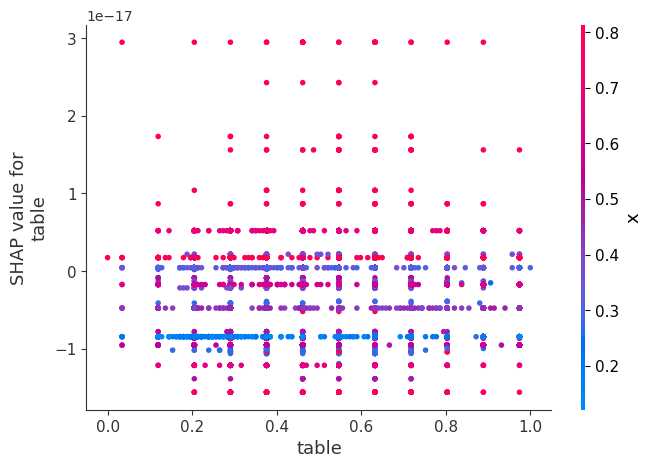

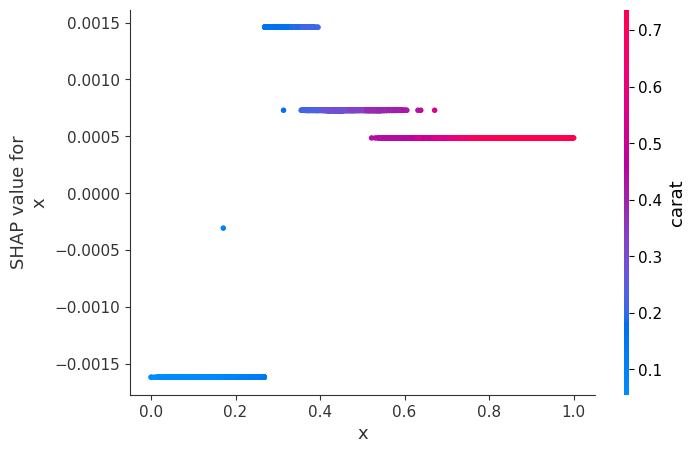

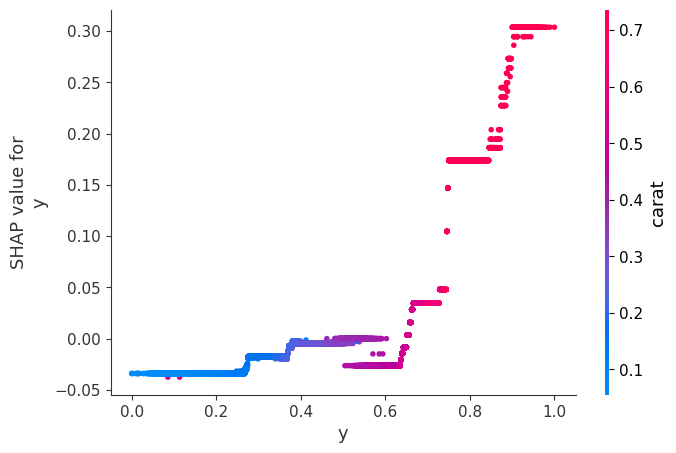

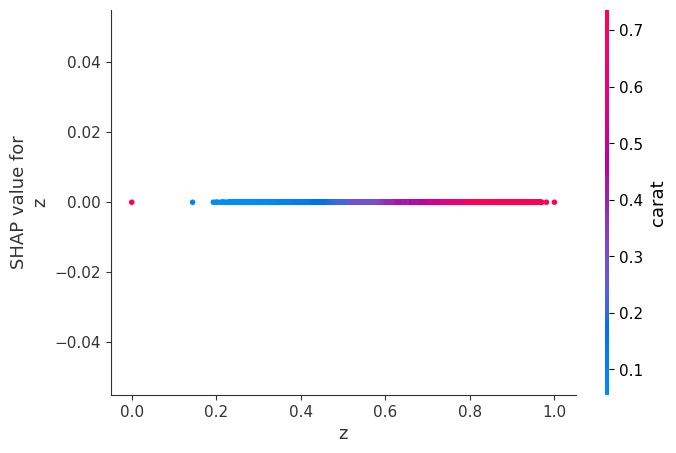

In [187]:

# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [188]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [189]:

# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

# Force Plot SHAP analysis
This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read


In [190]:

shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(18))  # SHAP force plot for sample 18

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis
LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below x, table, depth, z harmed both linear and tree-based model whereas carat and y, had a positive effect on the price of gem in both models
These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

# Linear Model

In [191]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)
     

In [192]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation
     

Prediction :  [0.2569928]
Actual :      0.15790612156608264


In [193]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

# Tree Based Model

In [194]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [195]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [0.29317298]
Actual :      0.15790612156608264


In [196]:

lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

# PDP(Partial Dependence Plot) for Linear model and Tree-based Model
Linear Model -
If we closely look at the PDP of the linear model we can see that if features carat, table, depth are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(price of gem) 

2. Tree-Based Model - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

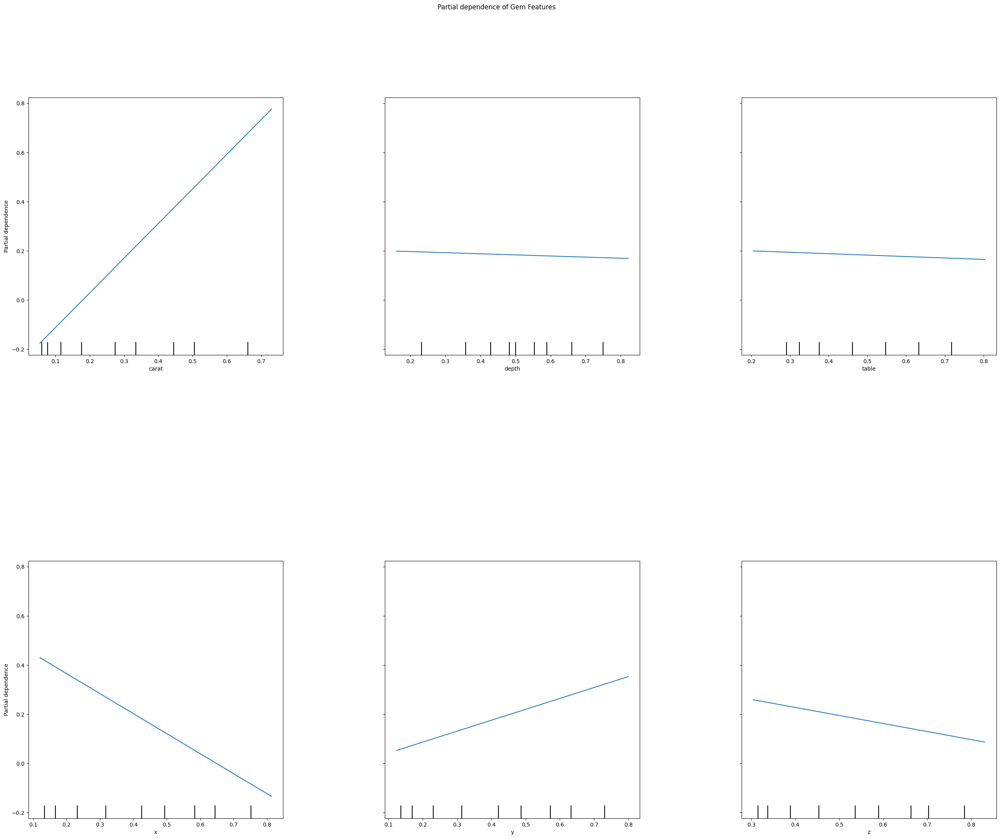

In [197]:
# PDP Plot for Linear Model
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns,n_jobs=3, grid_resolution=20 )
fig = plt.gcf()
fig.suptitle("Partial dependence of Gem Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

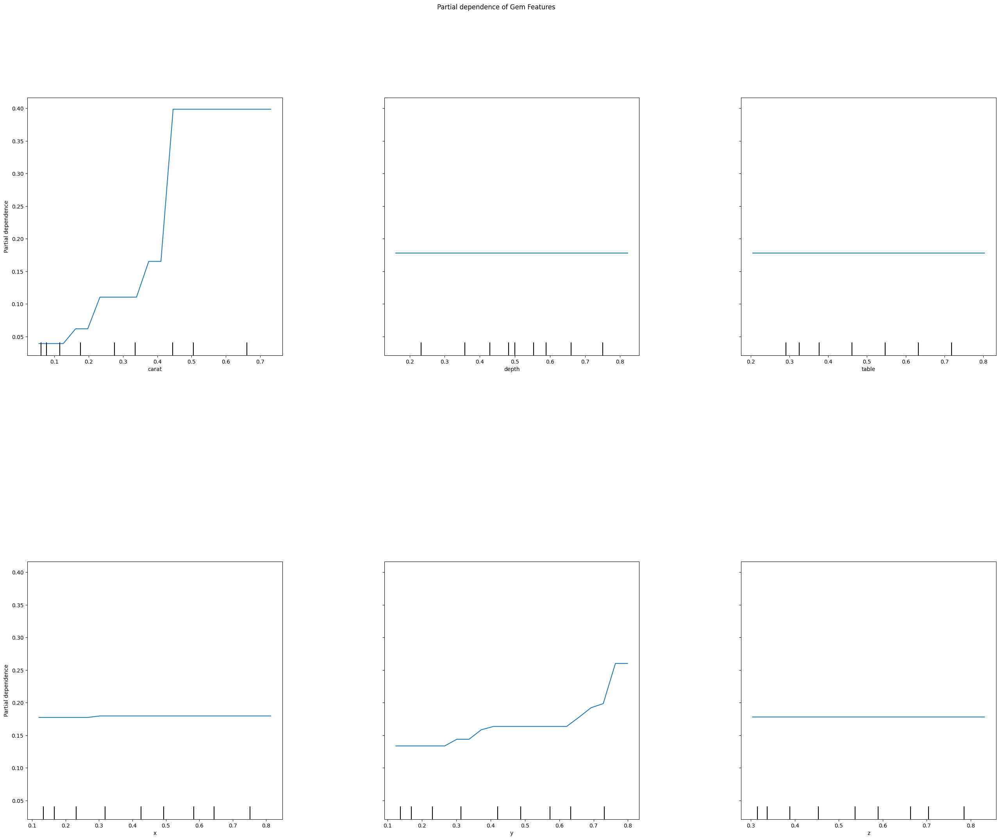

In [198]:
# PDP Plot for Linear Model
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns,n_jobs=3, grid_resolution=20 )
fig = plt.gcf()
fig.suptitle("Partial dependence of Gem Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

# Comparision between SHAP, LIME, and Partial Dependence Plot Analysis
Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

PDP gives the extent of effect a variable has on the output by freezing the rest of them
SHAP gives how much each variable contributes to the prediction
LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output
We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

# Conclusion

It is evident from the examination of the data set that there is multicolinearity and that all dependent variables are important.


To estimate gem prices, a fundamental algorithm based on the linear regression technique was created. Some of the independent variables were thought to be ignored by VIF, p-values, and other tests. The dataset's variables were tested and trained using the H20.ai framework. This resulted in the best model being given as "gbm," and train data accuracy was 99%. The results indicate that, to a certain extent, the suggested linear regression model can assess and predict the price of gems. The model has to be improved in future studies as the prediction accuracy is admittedly still constrained in several areas. Several methods, such as reducing outliers and applying ensemble or booster, can help produce improved prediction in further study into the associated models.







# References
Molnar, C. (2022). Interpretable Machine Learning: A Guide for Making Black Box Models Explainable (2nd ed.)
christophm.github.io/interpretable-ml-book/

1. Sckit learn offcial documentation

2. Refered Towards Data Science

3. Eli5 official documentation

The algorithms were referred directly from the Sckit learn official documentation. Visualization was referred from the Machine Learning with scikit-learn Quick Start Guide and Towards Data Science (How do you check the quality of your regression model in Python?). The remaining code was written independently. Feature importance reference is taken from eli5 offical documnetation

https://rstudio-pubs-static.s3.amazonaws.com/64286_2635bf8b05fb4423ac2968243211b46b.html https://docs.h2o.ai/h2o/latest-stable/h2o-docs/grid-search.html https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb\ https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb
https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
https://medium.com/@kalia_65609/interpreting-an-nlp-model-with-lime-and-shap-834ccfa124e4#:~:text=Unlike%20LIME%2C%20SHAP%20does%20not,to%20calculate%20the%20feature%20importance.


License Copyright (c) 2023 Pranali Ramesh Sawant and AISkunks

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.